In [1]:
import warnings
warnings.filterwarnings('ignore')

# 1. Graph

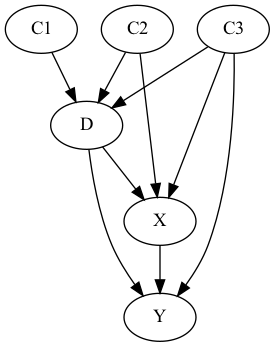

In [6]:
import pygraphviz as pgv
from IPython.display import Image

# Create a new directed graph
G = pgv.AGraph(directed=True)

# Add nodes
nodes = ['X', 'D', 'Y', 'C1', 'C2', 'C3']
for node in nodes:
    G.add_node(node)

# Add edges
edges = [('D', 'Y'),
    ('D', 'X'),
    ('C2', 'D'),
    ('C3', 'D'),
    ['C2', 'X'],
    ('C3', 'Y'),
    ('C1', 'D'),
    ('X', 'Y'),
    ('D', 'X'),
    ('C3', 'X'),
    ('D', 'Y')]
for edge in edges:
    G.add_edge(edge[0], edge[1])

# Draw the graph to a file
#G.draw('dag.png', prog='dot', format='png')

# Display the image
Image(filename='dag.png')


In [52]:
import networkx as nx
causal_graph = nx.DiGraph([('X', 'Y'), ('Y', 'Z')])

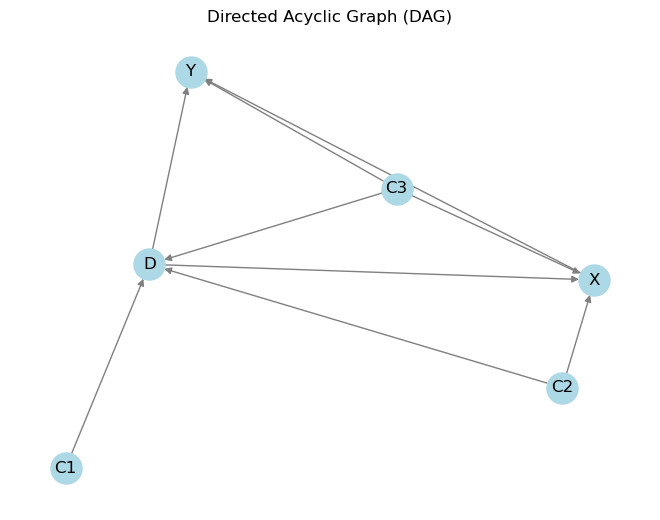

          X         D         Y        C1        C2        C3
0 -1.003716 -1.917116 -4.686427 -0.090484  0.590593 -0.478943
1  0.650481 -0.556903  0.637236 -0.355087 -1.353367  0.269871
2 -0.536676 -0.620432 -1.712427  0.130405  0.918898 -0.895205
3 -1.219782 -0.100726 -3.663027 -0.415166  1.908308 -0.191625
4  1.845482  1.316999  4.897088  0.448274 -0.122352 -0.305982


In [32]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty directed graph
G = nx.DiGraph()

# Define the nodes
nodes = ['X', 'D', 'Y', 'C1', 'C2', 'C3']
for node in nodes:
    G.add_node(node)

# Add edges
edges = [('D', 'Y'),
         ('D', 'X'),
         ('C2', 'D'),
         ('C3', 'D'),
         ('C2', 'X'),
         ('C3', 'Y'),
         ('C1', 'D'),
         ('X', 'Y'),
         ('D', 'X'),
         ('C3', 'X'),
         ('D', 'Y')]
for edge in edges:
    G.add_edge(edge[0], edge[1])

# Generate synthetic data based on the equations
num_samples = 1000
data = pd.DataFrame()
for node in nodes:
    data[node] = np.random.normal(0, 1, size=num_samples)

data['D'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
data['X'] = 0.7 * data['D'] + 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['Y'] = 1.5 * data['D'] + 2 * data['X'] + 0.8 * data['C3'] + np.random.normal(0, 1, size=num_samples)

# Plot the DAG
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray', arrows=True)
plt.title('Directed Acyclic Graph (DAG)')
plt.show()

# Print the synthetic data
print(data.head())


## Assignment

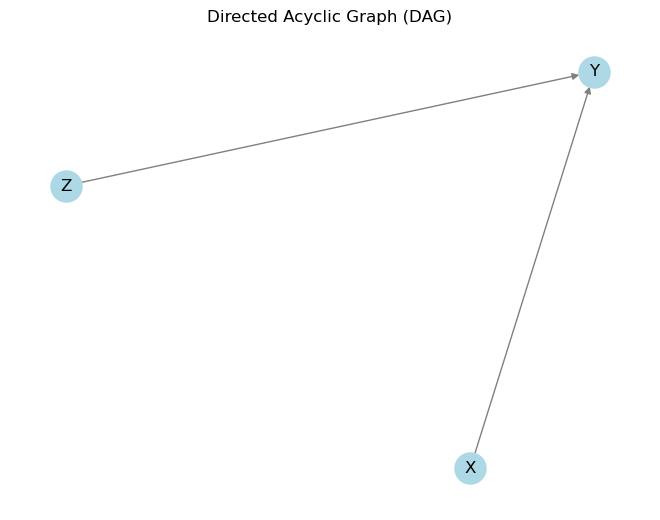

          X         Z         Y
0  1.064552  0.795886  2.411046
1 -0.587893 -1.335795 -5.204945
2  0.681709  0.685935  2.501827
3 -1.310150  0.108048 -2.222615
4 -1.399007  0.479370 -1.047966


In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty directed graph
G = nx.DiGraph()

# Define the nodes
nodes = ['X', 'Z', 'Y', ]
for node in nodes:
    G.add_node(node)

# Add edges
edges = [('X', 'Y'),
         ('Z', 'Y'),
         ]
for edge in edges:
    G.add_edge(edge[0], edge[1])

# Generate synthetic data based on the equations
num_samples = 10000
data = pd.DataFrame()
for node in nodes:
    data[node] = np.random.normal(0, 1, size=num_samples)

#data['X'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
#data['Z'] = 0.7 * data['D'] + 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['X'] =  np.random.normal(0, 1, size=num_samples)
data['Z'] =  np.random.normal(0, 1, size=num_samples)
data['Y'] = 1.5 * data['X'] + 2 * data['Z'] + np.random.normal(0, 1, size=num_samples)

# Plot the DAG
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray', arrows=True)
plt.title('Directed Acyclic Graph (DAG)')
plt.show()

# Print the synthetic data
print(data.head())


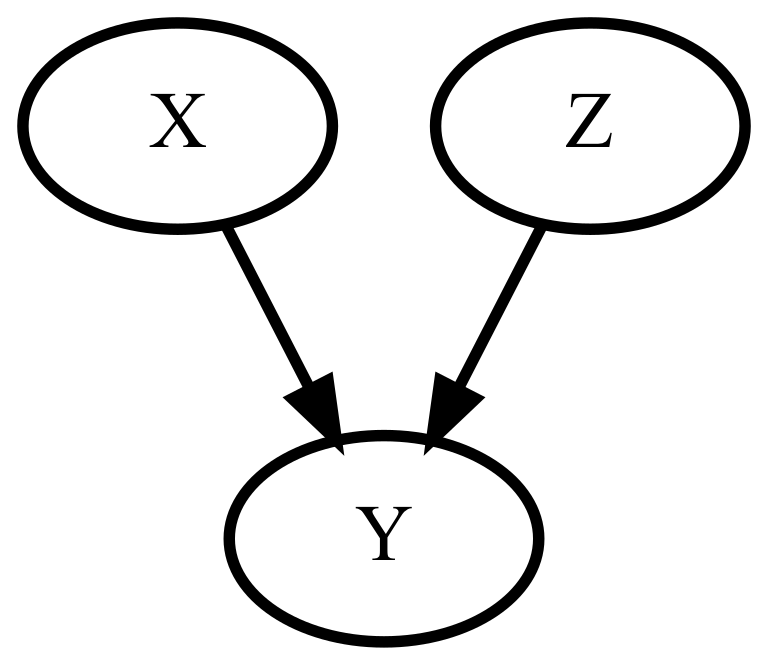

Causal effect estimate: 3.531216835271783
Causal effect confidence intervals:
Interval 1
Lower bound: 1.4907494130109906
Upper bound: 1.530021307479122
Interval 2
Lower bound: 2.0013288218813523
Upper bound: 2.0403341281720992


In [2]:
import dowhy
from dowhy import CausalModel

# Define the causal model
model = CausalModel(
    data=data,  # Your data
    treatment=['X', 'Z'],  # Treatment variable
    outcome='Y',  # Outcome variable
    #common_causes=['Z'], # List of common causes, 
    #mediator ='Corrosion Rate'
)
model.view_model()

from IPython.display import Image, display
display(Image(filename="causal_model.png"))

# Identify the causal effect
identified_estimand = model.identify_effect()

# Estimate the causal effect using linear regression adjustment
estimate = model.estimate_effect(identified_estimand,
                                 method_name='backdoor.linear_regression')
# Output the causal effect
print("Causal effect estimate:", estimate.value)
print("Causal effect confidence intervals:")
confidence_intervals = estimate.get_confidence_intervals()
for i in range(len(confidence_intervals)):
    print("Interval", i+1)
    print("Lower bound:", confidence_intervals[i][0])
    print("Upper bound:", confidence_intervals[i][1])

In [3]:
from statsmodels.api import OLS
model=OLS(data['Y'], data[['X', 'Z']])
result = model.fit()
result.summary(0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      0   R-squared (uncentered):                   0.866
Model:                            OLS   Adj. R-squared (uncentered):              0.866
Method:                 Least Squares   F-statistic:                          3.224e+04
Date:                Wed, 02 Aug 2023   Prob (F-statistic):                        0.00
Time:                        10:55:28   Log-Likelihood:                         -14153.
No. Observations:               10000   AIC:                                  2.831e+04
Df Residuals:                    9998   BIC:                                  2.832e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
X              1.5103      0.010    150.739      0.000       1.491       1.530
Z              2.0209      0.010    203.076      0.000       2.001       2.040
==============================================================================
Omnibus:                        0.076   Durbin-Watson:                   1.963
Prob(Omnibus):                  0.963   Jarque-Bera (JB):                0.092
Skew:                          -0.004   Prob(JB):                        0.955
Kurtosis:                       2.988   Cond. No.                         1.01
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

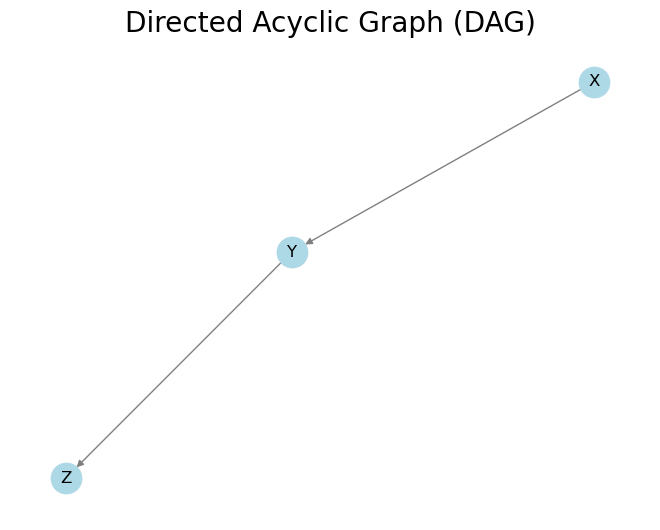

          X         Z         Y
0 -0.255707  6.811430  2.175593
1  0.144328  8.530804  2.506253
2 -0.408889  3.989321  1.734983
3  0.574761  9.833744  5.372370
4 -1.231443  2.094516  0.032976


In [34]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty directed graph
G = nx.DiGraph()

# Define the nodes
nodes = ['X', 'Z', 'Y']
for node in nodes:
    G.add_node(node)

# Add edges
edges = [('X', 'Y'),
         ('Y', 'Z'),
         ]
for edge in edges:
    G.add_edge(edge[0], edge[1])

# Generate synthetic data based on the equations
num_samples = 10000
data = pd.DataFrame()
for node in nodes:
    data[node] = np.random.normal(0, 1, size=num_samples)

#data['X'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
#data['Z'] = 0.7 * data['D'] + 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['Y'] = 3 +  1.5 * data['X'] + np.random.normal(0, 1, size=num_samples)
data['Z'] = 3 + 1.5 * data ['Y'] + np.random.normal(0, 1, size=num_samples)

# Plot the DAG
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray', arrows=True)
plt.title('Directed Acyclic Graph (DAG)')
plt.show()

# Print the synthetic data
print(data.head())


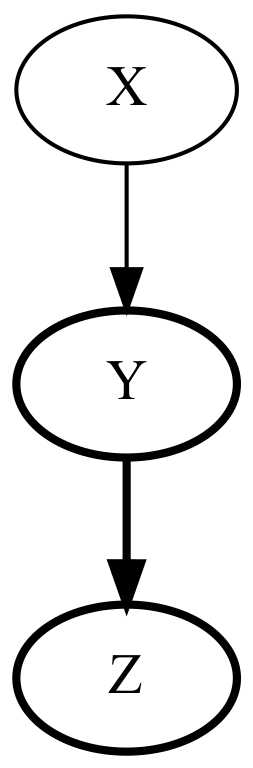

Causal effect estimate: 1.501604909551876
Causal effect confidence intervals:
Interval 1
Lower bound: 1.4907508896088633
Upper bound: 1.512458929494887


In [5]:
import dowhy
from dowhy import CausalModel

# Define the causal model
model = CausalModel(
    data=data,  # Your data
    treatment=['Y'],  # Treatment variable
    outcome='Z',  # Outcome variable
    #common_causes=['Z'], # List of common causes, 
    instruments ='X'
)
model.view_model()

from IPython.display import Image, display
display(Image(filename="causal_model.png"))

# Identify the causal effect
identified_estimand = model.identify_effect()

# Estimate the causal effect using linear regression adjustment
estimate = model.estimate_effect(identified_estimand,
                                 method_name='backdoor.linear_regression')
# Output the causal effect
print("Causal effect estimate:", estimate.value)
print("Causal effect confidence intervals:")
confidence_intervals = estimate.get_confidence_intervals()
for i in range(len(confidence_intervals)):
    print("Interval", i+1)
    print("Lower bound:", confidence_intervals[i][0])
    print("Upper bound:", confidence_intervals[i][1])

In [10]:
from statsmodels.api import OLS
data['intercept']= 1
model=OLS(data['Z'], data[['Y', 'intercept']])
result = model.fit()
result.summary(0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      0   R-squared:                       0.880
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                 7.354e+04
Date:                Wed, 02 Aug 2023   Prob (F-statistic):               0.00
Time:                        10:59:39   Log-Likelihood:                -14149.
No. Observations:               10000   AIC:                         2.830e+04
Df Residuals:                    9998   BIC:                         2.832e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Y              1.5016      0.006    271.185      0.000       1.491       1.512
intercept      3.0118      0.019    156.630      0.000       2.974       3.049
==============================================================================
Omnibus:                        6.447   Durbin-Watson:                   2.019
Prob(Omnibus):                  0.040   Jarque-Bera (JB):                6.509
Skew:                           0.049   Prob(JB):                       0.0386
Kurtosis:                       3.078   Cond. No.                         7.12
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

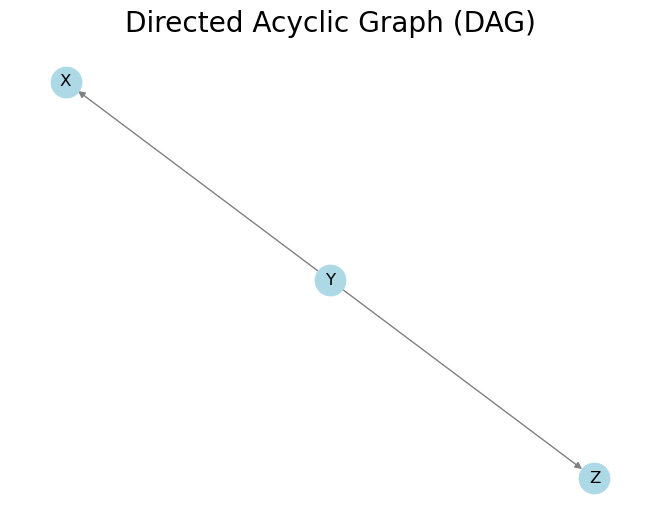

          X         Z         Y
0  4.584349  3.225043 -0.442005
1  0.879830  1.707687 -1.026692
2  2.152951  3.585253  0.188971
3  1.379597  2.513943 -0.074674
4  3.538403  4.703761  0.573479


In [32]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty directed graph
G = nx.DiGraph()

# Define the nodes
nodes = ['X', 'Z', 'Y', ]
for node in nodes:
    G.add_node(node)

# Add edges
edges = [('Y', 'X'),
         ('Y', 'Z'),
         ]
for edge in edges:
    G.add_edge(edge[0], edge[1])

# Generate synthetic data based on the equations
num_samples = 10000
data = pd.DataFrame()
for node in nodes:
    data[node] = np.random.normal(0, 1, size=num_samples)

#data['X'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
#data['Z'] = 0.7 * data['D'] + 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['X'] = 3 +  1.5 * data['Y'] + np.random.normal(0, 1, size=num_samples)
data['Z'] = 3 + 1.5 * data ['Y'] + np.random.normal(0, 1, size=num_samples)

# Plot the DAG
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray', arrows=True)
plt.title('Directed Acyclic Graph (DAG)')
plt.show()

# Print the synthetic data
print(data.head())


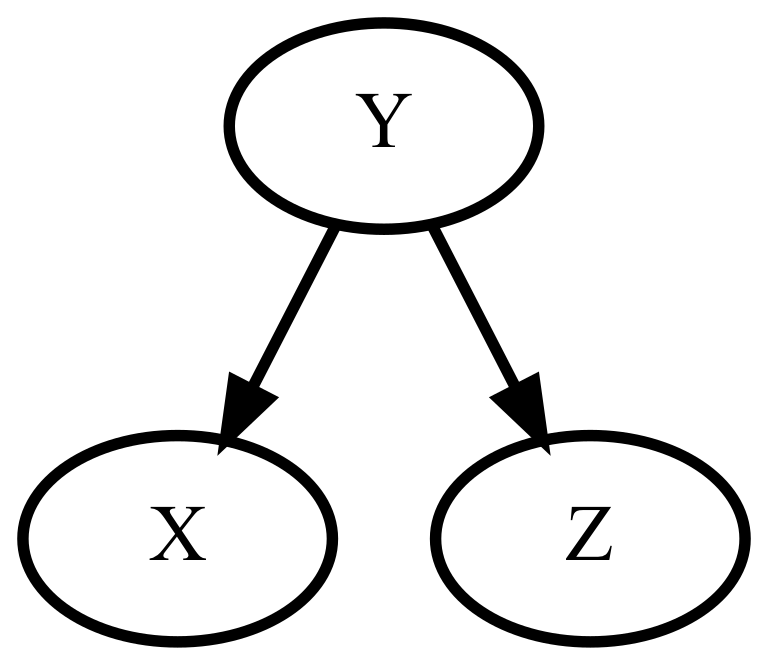

Causal effect estimate: 1.4956843594383553
Causal effect confidence intervals:
Interval 1
Lower bound: 1.4764917473962462
Upper bound: 1.5148769714804649


In [12]:
import dowhy
from dowhy import CausalModel

# Define the causal model
model = CausalModel(
    data=data,  # Your data
    treatment='Y',  # Treatment variable
    outcome=['X','Z'],  # Outcome variable
    #common_causes=['Z'], # List of common causes, 
    #mediator ='Corrosion Rate'
)
model.view_model()

from IPython.display import Image, display
display(Image(filename="causal_model.png"))

# Identify the causal effect
identified_estimand = model.identify_effect()

# Estimate the causal effect using linear regression adjustment
estimate = model.estimate_effect(identified_estimand,
                                 method_name='backdoor.linear_regression')
# Output the causal effect
print("Causal effect estimate:", estimate.value)
print("Causal effect confidence intervals:")
confidence_intervals = estimate.get_confidence_intervals()
for i in range(len(confidence_intervals)):
    print("Interval", i+1)
    print("Lower bound:", confidence_intervals[i][0])
    print("Upper bound:", confidence_intervals[i][1])

In [14]:
from statsmodels.api import OLS
data['intercept'] = 1
model=OLS(data['X'], data[['Y', 'intercept']])
result = model.fit()
result.summary(0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      0   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                 2.334e+04
Date:                Wed, 02 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:00:38   Log-Likelihood:                -14036.
No. Observations:               10000   AIC:                         2.808e+04
Df Residuals:                    9998   BIC:                         2.809e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Y              1.4957      0.010    152.759      0.000       1.476       1.515
intercept      3.0196      0.010    306.526      0.000       3.000       3.039
==============================================================================
Omnibus:                        0.203   Durbin-Watson:                   2.027
Prob(Omnibus):                  0.903   Jarque-Bera (JB):                0.195
Skew:                          -0.011   Prob(JB):                        0.907
Kurtosis:                       3.005   Cond. No.                         1.02
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

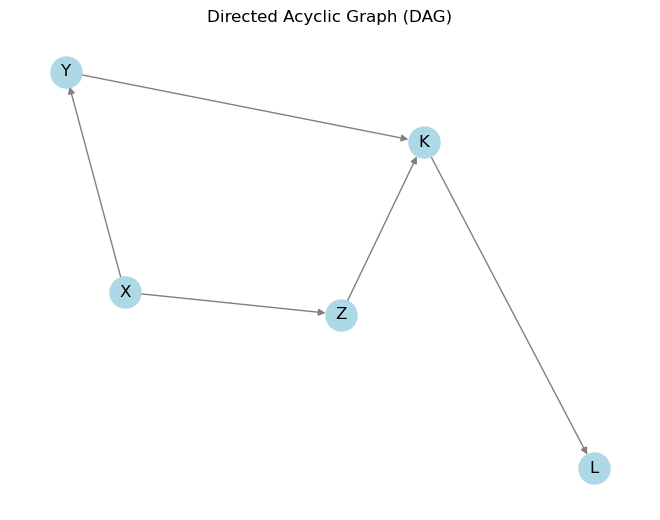

           X          Z          Y          K          L
0   4.666545  11.410244   9.994036  39.284415  61.546496
1 -12.567278 -15.189949 -14.966075 -48.295985 -69.169919
2  -8.804329 -11.143228 -10.332936 -36.188534 -51.114822
3 -11.974097 -13.368855 -13.303189 -43.208129 -61.993844
4   2.924859   8.308931   8.092025  32.538991  51.046584


In [2]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty directed graph
G = nx.DiGraph()

# Define the nodes
nodes = ['X', 'Z', 'Y', 'K', 'L' ]
for node in nodes:
    G.add_node(node)

# Add edges
edges = [('X', 'Y'),
         ('X', 'Z'),
         ('Y', 'K'),
         ('Z', 'K'),
         ('K', 'L')         
         ]
for edge in edges:
    G.add_edge(edge[0], edge[1])

# Generate synthetic data based on the equations
num_samples = 10000
data = pd.DataFrame()
for node in nodes:
    data[node] = np.random.normal(0, 1, size=num_samples)

#data['X'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
#data['Z'] = 0.7 * data['D'] + 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['X'] = np.random.normal(0, 10, size=num_samples)+ np.random.normal(0, 1, size=num_samples)
data['Y'] = 3 +  1.5 * data['X'] + np.random.normal(0, 1, size=num_samples)
data['Z'] = 3 + 1.5 * data ['X'] + np.random.normal(0, 1, size=num_samples)
data['K'] = 3 + 1.5 * data['Y'] + 2 * data['Z'] + np.random.normal(0, 1, size=num_samples)
data['L'] = 3 + 1.5 * data['K'] + np.random.normal(0, 1, size=num_samples)

# Plot the DAG
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray', arrows=True)
plt.title('Directed Acyclic Graph (DAG)')
plt.show()

# Print the synthetic data
print(data.head())


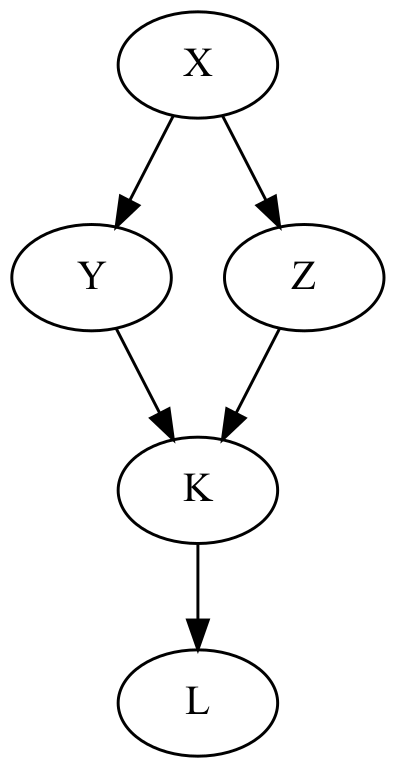

Causal effect estimate: 7.865951502552157
Causal effect confidence intervals:
Interval 1
Lower bound: 7.857769740221236
Upper bound: 7.8741332648830715


In [4]:
import dowhy
from dowhy import CausalModel

causal_graph = """
digraph {
    X->Y;
    X->Z;
    Y->K;
    Z->K;
    K->L;         
}
"""

# Define the causal model
model = CausalModel(
    data=data,  # Your data
    treatment='X',  # Treatment variable
    outcome='L',  # Outcome variable
    #common_causes=[ 'K'],  # Empty list as there are no common causes
    mediator ='K',
    instruments=['Z', 'Y'],  # Instruments affecting the treatment
    graph=causal_graph  # The DAG representing the causal relationships
)

model.view_model()

from IPython.display import Image, display
display(Image(filename="causal_model.png"))

# Identify the causal effect
identified_estimand = model.identify_effect()

# Estimate the causal effect using linear regression adjustment
estimate = model.estimate_effect(identified_estimand,
                                 method_name='backdoor.linear_regression')
# Output the causal effect
print("Causal effect estimate:", estimate.value)
print("Causal effect confidence intervals:")
confidence_intervals = estimate.get_confidence_intervals()
for i in range(len(confidence_intervals)):
    print("Interval", i+1)
    print("Lower bound:", confidence_intervals[i][0])
    print("Upper bound:", confidence_intervals[i][1])

In [44]:
from statsmodels.api import OLS
data['intercept']=1
model=OLS(data['L'], data[['X', 'intercept']])
result = model.fit()
result.summary(0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      0   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                 3.519e+06
Date:                Wed, 02 Aug 2023   Prob (F-statistic):               0.00
Time:                        16:42:39   Log-Likelihood:                -28563.
No. Observations:               10000   AIC:                         5.713e+04
Df Residuals:                    9998   BIC:                         5.714e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
X              7.8745      0.004   1875.902      0.000       7.866       7.883
intercept     23.2645      0.042    552.439      0.000      23.182      23.347
==============================================================================
Omnibus:                        2.202   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.332   Jarque-Bera (JB):                2.213
Skew:                          -0.036   Prob(JB):                        0.331
Kurtosis:                       2.991   Cond. No.                         10.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

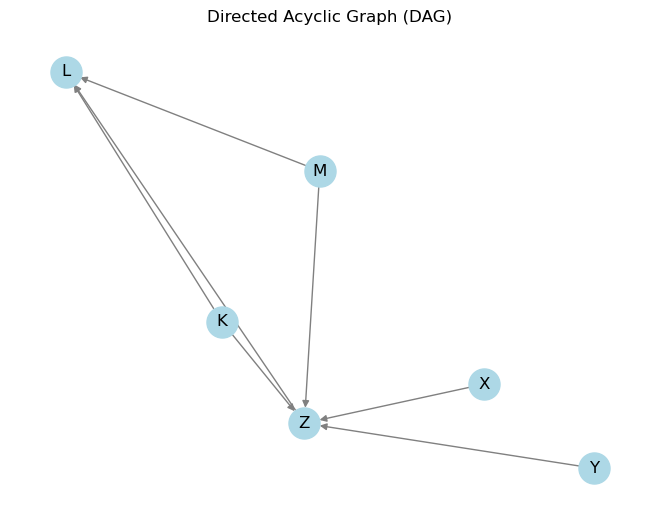

          X         Z         Y         K         M          L
0 -0.305018  4.884027  0.349410  0.363735 -0.083006  12.354485
1  0.825827  6.165418  0.854934 -0.175443  0.608330  14.101791
2  2.027066  6.050891  1.188406  0.084383 -1.234558  11.292821
3  0.980134  3.861507 -0.353055 -1.060667  1.060783   9.752632
4  2.246183  8.935344  1.325789  0.471002  0.087965  16.471658


In [18]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty directed graph
G = nx.DiGraph()

# Define the nodes
nodes = ['X', 'Z', 'Y', 'K', 'M', 'L']
for node in nodes:
    G.add_node(node)

# Add edges
edges = [('X', 'Z'),
         ('Y', 'Z'),
         ('M', 'Z'),
         ('K', 'Z'),
         ('M', 'L'),
         ('K', 'L'),
         ('Z', 'L')         
         ]
for edge in edges:
    G.add_edge(edge[0], edge[1])

# Generate synthetic data based on the equations
num_samples = 10000000
data = pd.DataFrame()
for node in nodes:
    data[node] = np.random.normal(0, 1, size=num_samples)

#data['X'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
#data['Z'] = 0.7 * data['D'] + 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)

data['Z'] = 3 + 1.5 * data ['X']+ 1.5 * data ['Y'] + 1.5 * data ['M']+ 1.5 * data ['K'] + np.random.normal(0, 1, size=num_samples)
data['L'] = 3 + 1.5 * data['K'] +1.5 * data['Z']+1.5 * data['M']+ np.random.normal(0, 1, size=num_samples)

# Plot the DAG
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray', arrows=True)
plt.title('Directed Acyclic Graph (DAG)')
plt.show()

# Print the synthetic data
print(data.head())


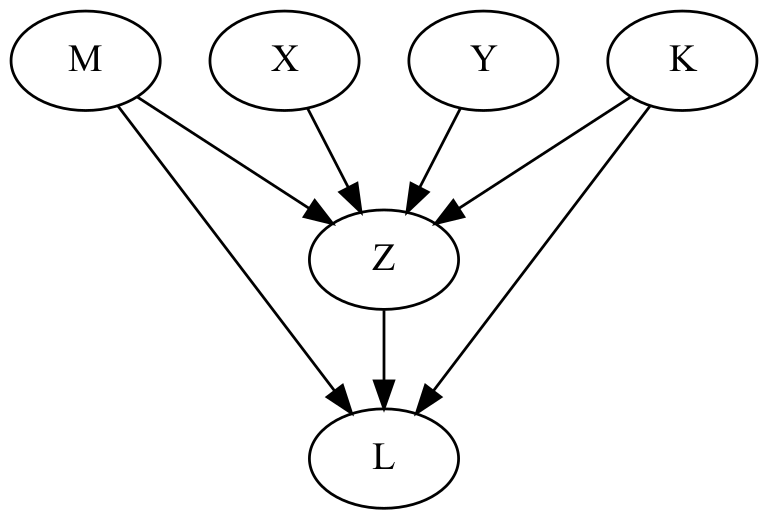

Causal effect estimate: 1.5000708092212083
Causal effect confidence intervals:
Interval 1
Lower bound: [1.49980645 1.50033516]
Upper bound: [1.49980645 1.50033516]


In [2]:
import dowhy
from dowhy import CausalModel

causal_graph = """
digraph {
    X->Z;
    Y->Z;
    M->Z;
    K->Z;
    M->L;
    K->L;
    Z->L;         
}
"""

# Define the causal model
model = CausalModel(
    data=data,  # Your data
    treatment='Z',  # Treatment variable
    outcome='L',  # Outcome variable
    instruments=['X', 'Y'],  # Empty list as there are no common causes
    common_causes=[ 'M', 'K'],  # Instruments affecting the treatment
    graph=causal_graph  # The DAG representing the causal relationships
)

model.view_model()

from IPython.display import Image, display
display(Image(filename="causal_model.png"))

# Identify the causal effect
identified_estimand = model.identify_effect()

# Estimate the causal effect using linear regression adjustment
estimate = model.estimate_effect(identified_estimand,
                                 method_name='backdoor.linear_regression')
# Output the causal effect
print("Causal effect estimate:", estimate.value)
print("Causal effect confidence intervals:")
confidence_intervals = estimate.get_confidence_intervals()
for i in range(len(confidence_intervals)):
    print("Interval", i+1)
    print("Lower bound:", confidence_intervals[i])
    print("Upper bound:", confidence_intervals[i])

In [3]:
from causalnex.structure.notears import from_pandas

sm = from_pandas(data)

https://github.com/causalvis/causalvis/blob/master/notebook/Examples/Causal_Inference_Causalvis.png

In [4]:
from causalvis import DAG

DAG(nx_graph=sm)

DAG(component='DAG', props={'attributes': None, 'graph': {'nodes': [{'x': 0.5786308092733827, 'y': 0.016471594…

In [3]:
from causalvis import DAG

DAG(data = data)

DAG(component='DAG', props={'attributes': ['K', 'L', 'M', 'X', 'Y', 'Z'], 'graph': None})

In [5]:
from sklearn.linear_model import LogisticRegression
from causallib.estimation import IPW

lr=LogisticRegression(solver='lbfgs', max_iter=1000)
ipw=IPW(lr)

In [6]:
a = data['Z']
X = data[['X', 'Y', 'K', 'M', 'L']]
ipw.fit(X, a)

ValueError: Unknown label type: 'continuous'

In [12]:
from statsmodels.api import OLS
data['intercept']=1
model=OLS(data['L'], data[['Z', 'K', 'M', 'intercept']])
result = model.fit()
result.summary(0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      0   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                 1.350e+08
Date:                Thu, 03 Aug 2023   Prob (F-statistic):               0.00
Time:                        15:59:18   Log-Likelihood:            -1.4189e+07
No. Observations:            10000000   AIC:                         2.838e+07
Df Residuals:                 9999996   BIC:                         2.838e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Z              1.5000      0.000   1.11e+04      0.000       1.500       1.500
K              1.5000      0.000   3997.209      0.000       1.499       1.501
M              1.4999      0.000   3995.268      0.000       1.499       1.501
intercept      2.9994      0.001   5841.956      0.000       2.998       3.000
==============================================================================
Omnibus:                        1.962   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.375   Jarque-Bera (JB):                1.962
Skew:                          -0.000   Prob(JB):                        0.375
Kurtosis:                       3.002   Cond. No.                         8.41
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Experiments

### 1. DAG

/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_20918/1582159230.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


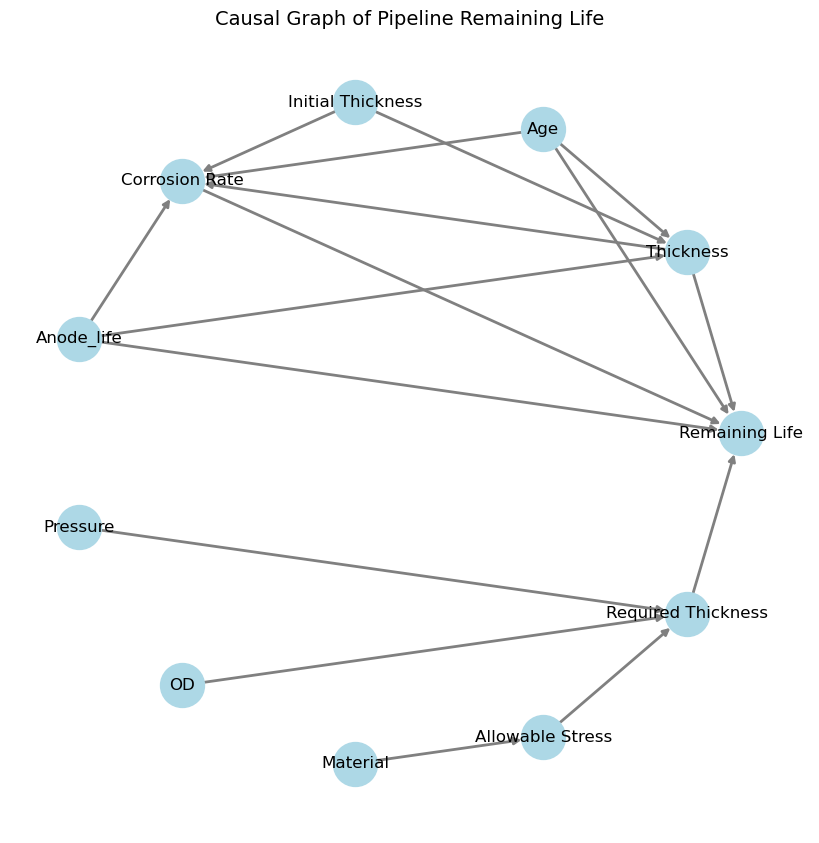

In [20]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a Directed Acyclic Graph (DAG)
G = nx.DiGraph()

# Add nodes to the graph
nodes = ['Remaining Life', 'Thickness', 
         'Age', 'Initial Thickness', 'Corrosion Rate', 'Anode_life', 
         'Pressure', 'OD', 'Material', 'Allowable Stress', 'Required Thickness']
G.add_nodes_from(nodes)

# Add edges to represent the causal relationships
edges = [('Thickness', 'Remaining Life'),
         ('Corrosion Rate', 'Remaining Life'), 
         ('Age', 'Remaining Life'), 
         ('Anode_life', 'Remaining Life'),
         ('Required Thickness', 'Remaining Life'),
         
         ('Initial Thickness', 'Corrosion Rate'), 
         ('Thickness', 'Corrosion Rate'),  # Corrosion Rate influences Thickness
         ('Age', 'Corrosion Rate'),  # Year influences Corrosion Rate
         ('Anode_life', 'Corrosion Rate'),  # Anode influences Corrosion Rate('Aniode)
         
         ('Initial Thickness', 'Thickness'),         
         #('Pressure', 'Thickness'), 
         #('OD', 'Thickness'), 
         #('Allowable Stress', 'Thickness'), 
         ('Anode_life', 'Thickness'), 
         ('Age', 'Thickness'),
         
         ('Material', 'Allowable Stress'),
         
         ('Pressure', 'Required Thickness'),
         ('OD', 'Required Thickness'),
         ('Allowable Stress', 'Required Thickness')
         ]  
G.add_edges_from(edges)

# Visualize the graph
plt.figure(figsize=(8, 8))

pos = nx.circular_layout(G)  # Use circular_layout algorithm
#pos = nx.spring_layout(G)

nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=1000, edge_color='gray', arrows=True, width=2.0)

# Set plot attributes
plt.title("Causal Graph of Pipeline Remaining Life", fontsize=14)
plt.axis('off')

# Show the graph
plt.tight_layout()
plt.show()

### 2. Synthetic Data

In [21]:
import pandas as pd
import numpy as np

# Define the number of samples
num_samples = 10000

# Generate random data for the variables with specified ranges
data = pd.DataFrame()
data['Initial_Thickness'] = np.random.randint(20, 40, size=num_samples)
data['Age'] = np.random.randint(1, 10, size=num_samples)

# Define the possible materials
materials = ['Carbon_Steel', 'Stainless_Steel', 'Copper']

# Create a random 'Material' column with 'num_samples' entries
data['Material'] = np.random.choice(materials, size=num_samples)

# Define the allowable stress values for each material
allowable_stresses = {
    'Carbon_Steel': 20000,  # Allowable Stress (S) for Carbon Steel: 20,000 psi
    'Stainless_Steel': 20000,  # Allowable Stress (S) for Stainless Steel: 20,000 psi
    'Copper': 6000  # Allowable Stress (S) for Copper: 6,000 psi
}

# Create the 'Allowable_Stress' column based on the 'Material' column
data['Allowable_Stress'] = data['Material'].map(allowable_stresses)

data['Pressure'] = np.random.randint(10000, 20000, size=num_samples)
data['OD'] = np.random.randint(20, 42, size=num_samples)

data['Required_Thickness'] = (data['Pressure'] * data['OD']) / (2 * data['Allowable_Stress'] * 1.0 + 0.8 * data['Pressure'])

# Options for 'Anode_life'
anode_life_options = [0, 10, 20, 30]
data['Anode_life'] = np.random.choice(anode_life_options, size=num_samples)

# Generate random values for thickness based on Age and Anode_life
data['Thickness'] = data['Initial_Thickness'] - ((data['Age'] / np.where(data['Anode_life'] == 0, 1, data['Anode_life']/10)))

# Calculate the corrosion rate based on the difference between 'Initial_Thickness' and 'Thickness'
data['Corrosion_Rate'] = (data['Initial_Thickness'] - data['Thickness']) / data['Age']

# Compute the Remaining_Life (Y) based on the given formula with added relationships
data['Remaining_Life'] = ((data['Thickness'] - data['Required_Thickness']) / data['Corrosion_Rate']) - (data['Age'] / np.where(data['Anode_life'] == 0, 1, data['Anode_life']/10))

# Set negative Remaining_Life values to zero
data['Remaining_Life'] = np.where(data['Remaining_Life'] < 0, 0, data['Remaining_Life'])

# Print the synthetic data
data.head(10)


,Initial_Thickness,Age,Material,Allowable_Stress,Pressure,OD,Required_Thickness,Anode_life,Thickness,Corrosion_Rate,Remaining_Life
0,20,1,Stainless_Steel,20000,18638,26,8.825068,30,19.666667,0.333333,32.191463
1,28,4,Carbon_Steel,20000,15625,29,8.630952,0,24.000000,1.000000,11.369048
2,24,9,Stainless_Steel,20000,10911,20,4.478255,10,15.000000,1.000000,1.521745
3,32,1,Copper,6000,19802,38,27.027039,0,31.000000,1.000000,2.972961
4,30,1,Copper,6000,17716,22,14.891490,20,29.500000,0.500000,28.717019
5,31,5,Stainless_Steel,20000,17416,26,8.395930,20,28.500000,0.500000,37.708141
6,29,7,Stainless_Steel,20000,13719,28,7.535664,0,22.000000,1.000000,7.464336
7,35,2,Carbon_Steel,20000,19669,36,12.704431,10,33.000000,1.000000,18.295569
8,30,4,Carbon_Steel,20000,19621,31,10.920753,20,28.000000,0.500000,32.158494
9,34,8,Copper,6000,16195,21,13.627785,0,26.000000,1.000000,4.372215


In [22]:
data['T']=np.where(data['Anode_life']==0, 0, 1) 
data.drop(columns=['Material'], inplace=True)
data.head(10)

,Initial_Thickness,Age,Allowable_Stress,Pressure,OD,Required_Thickness,Anode_life,Thickness,Corrosion_Rate,Remaining_Life,T
0,20,1,20000,18638,26,8.825068,30,19.666667,0.333333,32.191463,1
1,28,4,20000,15625,29,8.630952,0,24.000000,1.000000,11.369048,0
2,24,9,20000,10911,20,4.478255,10,15.000000,1.000000,1.521745,1
3,32,1,6000,19802,38,27.027039,0,31.000000,1.000000,2.972961,0
4,30,1,6000,17716,22,14.891490,20,29.500000,0.500000,28.717019,1
5,31,5,20000,17416,26,8.395930,20,28.500000,0.500000,37.708141,1
6,29,7,20000,13719,28,7.535664,0,22.000000,1.000000,7.464336,0
7,35,2,20000,19669,36,12.704431,10,33.000000,1.000000,18.295569,1
8,30,4,20000,19621,31,10.920753,20,28.000000,0.500000,32.158494,1
9,34,8,6000,16195,21,13.627785,0,26.000000,1.000000,4.372215,0


In [26]:
data['OC']=np.where(data['Remaining_Life']<5, 0, 1) 
data.head(10)

,Initial_Thickness,Age,Allowable_Stress,Pressure,OD,Required_Thickness,Anode_life,Thickness,Corrosion_Rate,Remaining_Life,T,OC
0,20,1,20000,18638,26,8.825068,30,19.666667,0.333333,32.191463,1,1
1,28,4,20000,15625,29,8.630952,0,24.000000,1.000000,11.369048,0,1
2,24,9,20000,10911,20,4.478255,10,15.000000,1.000000,1.521745,1,0
3,32,1,6000,19802,38,27.027039,0,31.000000,1.000000,2.972961,0,0
4,30,1,6000,17716,22,14.891490,20,29.500000,0.500000,28.717019,1,1
5,31,5,20000,17416,26,8.395930,20,28.500000,0.500000,37.708141,1,1
6,29,7,20000,13719,28,7.535664,0,22.000000,1.000000,7.464336,0,1
7,35,2,20000,19669,36,12.704431,10,33.000000,1.000000,18.295569,1,1
8,30,4,20000,19621,31,10.920753,20,28.000000,0.500000,32.158494,1,1
9,34,8,6000,16195,21,13.627785,0,26.000000,1.000000,4.372215,0,0


In [ ]:
import pandas as pd
from pivottablejs import pivot_ui
from IPython.display import display

pivot_ui(data)

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Initial_Thickness   10000 non-null  int64  
 1   Age                 10000 non-null  int64  
 2   Allowable_Stress    10000 non-null  int64  
 3   Pressure            10000 non-null  int64  
 4   OD                  10000 non-null  int64  
 5   Required_Thickness  10000 non-null  float64
 6   Anode_life          10000 non-null  int64  
 7   Thickness           10000 non-null  float64
 8   Corrosion_Rate      10000 non-null  float64
 9   Remaining_Life      10000 non-null  float64
 10  T                   10000 non-null  int64  
dtypes: float64(4), int64(7)
memory usage: 859.5 KB


In [27]:
data.describe()

,Initial_Thickness,Age,Allowable_Stress,Pressure,OD,Required_Thickness,Anode_life,Thickness,Corrosion_Rate,Remaining_Life,T,OC
count,10000.000000,10000.00000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,29.433900,5.02660,15287.600000,14990.06630,30.504100,12.151644,14.943000,25.876767,0.709550,22.598266,0.746200,0.755700
std,5.806238,2.58866,6615.985442,2893.88619,6.326688,5.735432,11.221824,6.328029,0.297891,21.594973,0.435206,0.429693
min,20.000000,1.00000,6000.000000,10000.00000,20.000000,4.172568,0.000000,11.000000,0.333333,0.000000,0.000000,0.000000
25%,24.000000,3.00000,6000.000000,12463.00000,25.000000,7.786534,0.000000,21.000000,0.333333,5.310814,0.000000,1.000000
50%,29.000000,5.00000,20000.000000,14967.50000,31.000000,10.324772,10.000000,26.000000,1.000000,16.168110,1.000000,1.000000
75%,34.000000,7.00000,20000.000000,17513.25000,36.000000,15.436749,30.000000,31.000000,1.000000,35.357429,1.000000,1.000000
max,39.000000,9.00000,20000.000000,19997.00000,41.000000,29.236656,30.000000,38.666667,1.000000,97.146208,1.000000,1.000000


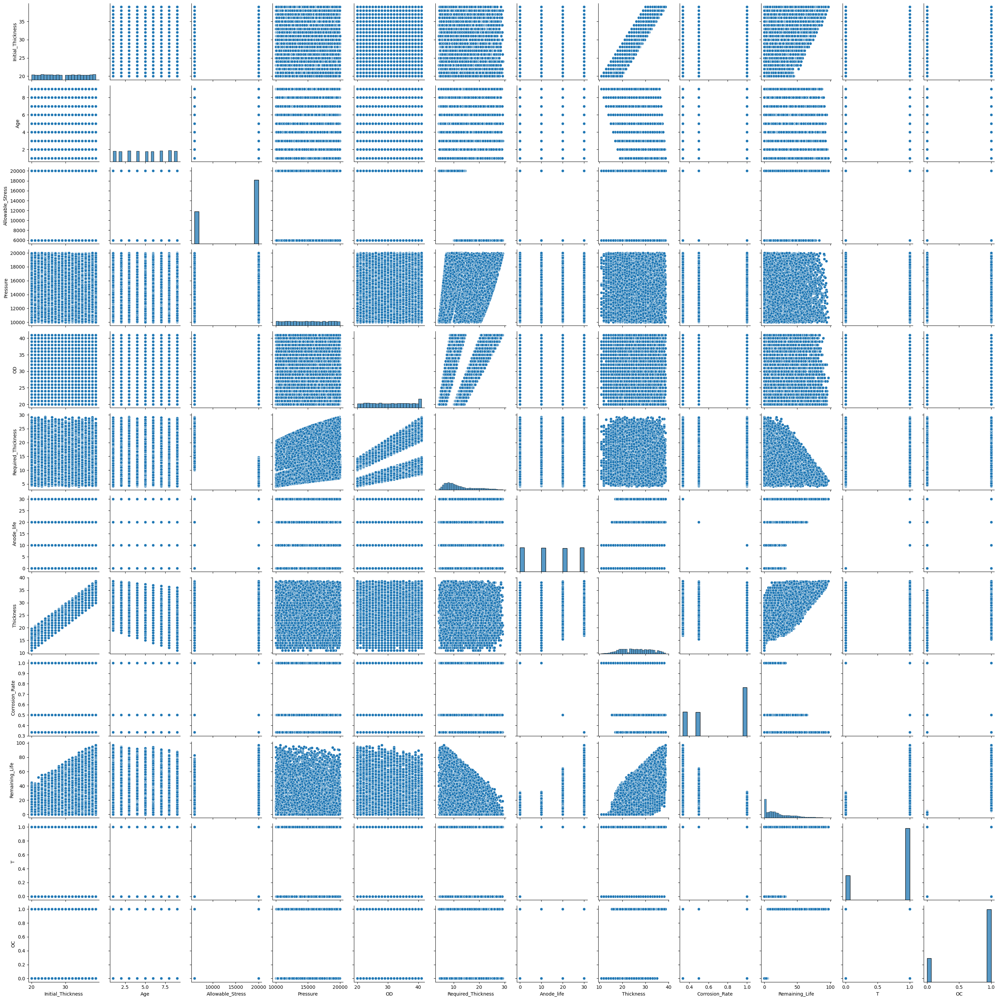

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a scatter plot matrix
sns.pairplot(data)
    
# Create a regression plot
#sns.lmplot(x='data['Corrosion Rate (X2)']', y='data['Remaining Life (Y)']', data=data)

# Show the plots
plt.show()

<AxesSubplot: >

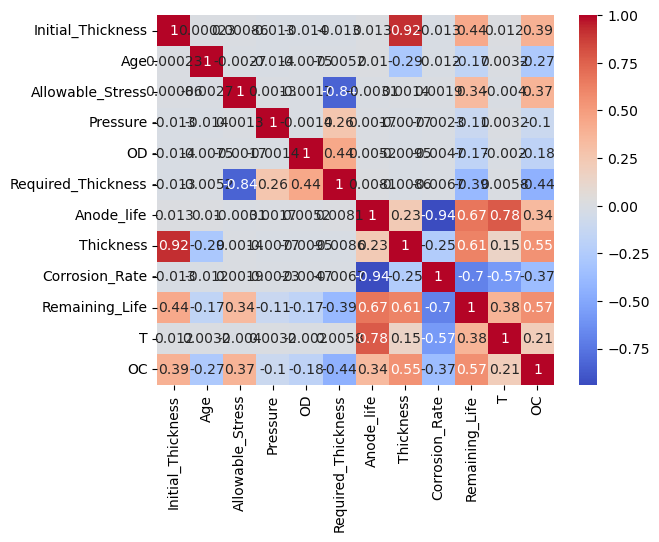

In [29]:
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

<Figure size 600x600 with 0 Axes>

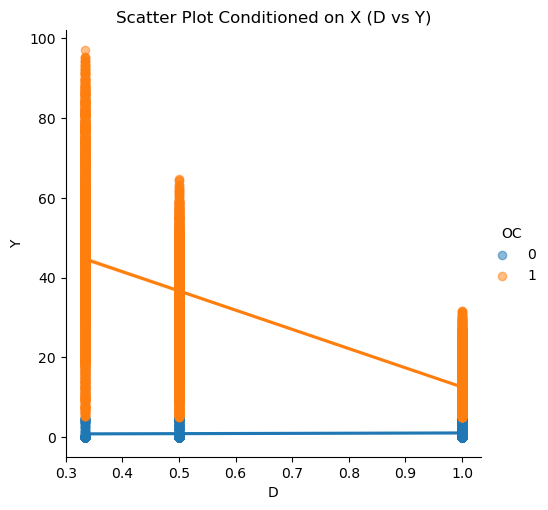

In [30]:
# Create a scatter plot conditioned on X
plt.figure(figsize=(6, 6))
sns.lmplot(x='Corrosion_Rate', y='Remaining_Life', data=data, hue='OC', scatter_kws={'alpha': 0.5})

# Set the title and labels for the plot
plt.title('Scatter Plot Conditioned on X (D vs Y)')
plt.xlabel('D')
plt.ylabel('Y')

# Show the plot
plt.show()

### 3. Causal Inference

In [31]:
import causalml

# Import the necessary modules from causalml
from causalml.inference.meta import LRSRegressor

import time

# Record the start time
start_time = time.time()

# Define the treatment variable and outcome variable
treatment_variable = 'Anode_life'
outcome_variable = 'Remaining_Life'

# Define the covariates (features) used for the regression model
covariates = ['Initial_Thickness', 'Age', 'Thickness', 'Corrosion_Rate', 'Pressure', 'OD',  'Allowable_Stress', 'Required_Thickness']

# Split the data into treatment, outcome, and covariates
treatment = data[treatment_variable].values
outcome = data[outcome_variable].values
covariates_data = data[covariates].values

# Create and fit the LRSRegressor model for causal inference
causal_model = LRSRegressor()
causal_model.fit(covariates_data, treatment, outcome)

# Estimate the causal effect
causal_effect = causal_model.estimate_ate(X=covariates_data, treatment=treatment, y=outcome)

# Record the end time
end_time = time.time()

# Calculate the computation time
computation_time = end_time - start_time

print("Causal effect estimate:", causal_effect)
print("Computation time:", computation_time, "seconds")


/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def delta_minimization_

Causal effect estimate: (array([ 0.09232719, 14.07620847, 23.63077808]), array([-0.03027284, 13.53072783, 22.67572221]), array([ 0.21492723, 14.62168912, 24.58583394]))
Computation time: 0.026813268661499023 seconds


In summary, the estimated causal effect is approximately 3.85, with a 95% confidence interval ranging from about 3.58 to 4.11. This means that we are reasonably confident that the true causal effect lies within this range based on the data and the chosen level of confidence.

### 3.2 Confidence interval

In [228]:
import matplotlib.pyplot as plt

# Assuming you have the following arrays from the causalml result
treatment_values = range(30)  # 0 to 29, representing Anode_life values
# Assuming you have the causalml result as 'causal_effect_result'
# The result may be in the form of a tuple with three arrays as follows:
causal_effect_result = causal_effect[0]  # Estimated causal effect for each treatment value
lower_bound = causal_effect[1]  # Lower bound of confidence interval for each treatment value
upper_bound = causal_effect[2]  # Upper bound of confidence interval for each treatment value

# Calculate the error bars
lower_error = causal_effect[0]-causal_effect[1]
upper_error = causal_effect[2]-causal_effect[0]

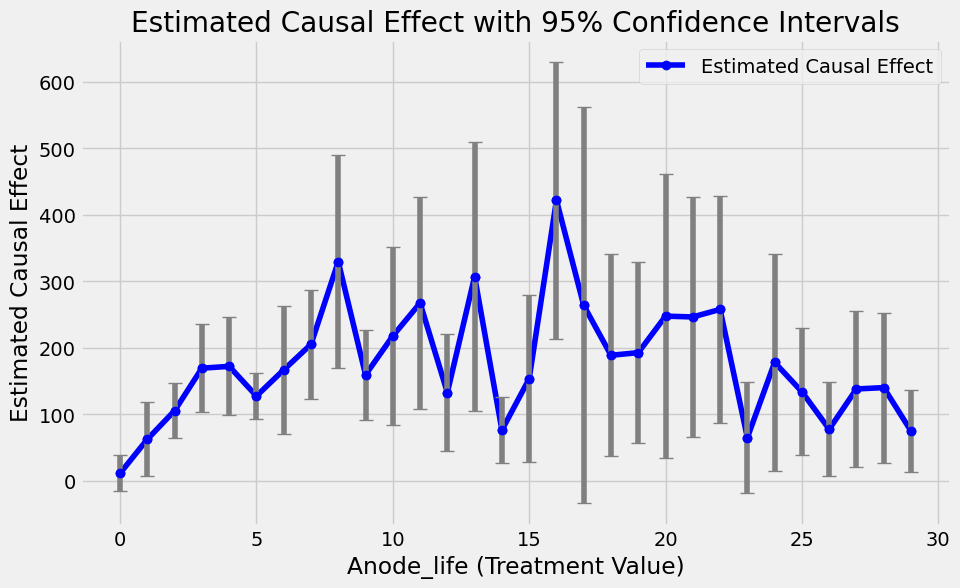

In [229]:
# Create a line plot for the estimated causal effect
plt.figure(figsize=(10, 6))
plt.plot(treatment_values, causal_effect_result, marker='o', color='blue', label='Estimated Causal Effect')

# Add error bars using the calculated error values
plt.errorbar(treatment_values, causal_effect_result, yerr=[lower_error, upper_error],
             fmt='o', color='blue', ecolor='gray', capsize=5, capthick=1)

# Set plot labels and title
plt.xlabel('Anode_life (Treatment Value)')
plt.ylabel('Estimated Causal Effect')
plt.title('Estimated Causal Effect with 95% Confidence Intervals')

# Show grid and legend
plt.grid(True)
plt.legend()

# Show the plot
plt.show()


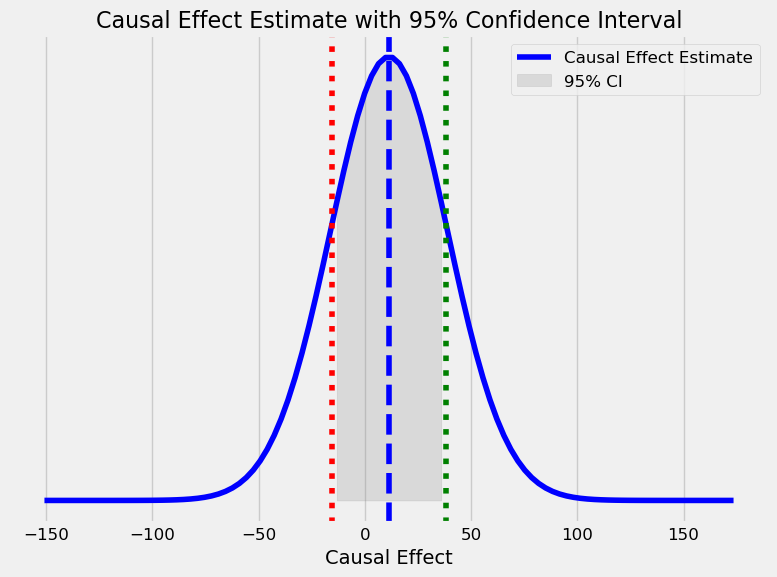

In [230]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm

# Causal effect estimate and confidence intervals
estimate = causal_effect[0][0]
lower_bound = causal_effect[1][0]
upper_bound = causal_effect[2][0]

# Generate data for the bell curve
x = np.linspace(estimate - 3 * (upper_bound - lower_bound), estimate + 3 * (upper_bound - lower_bound), 100)
y = norm.pdf(x, estimate, (upper_bound - lower_bound) / 1.96)

# Plot the confidence interval bell graph
plt.figure(figsize=(8, 6))
plt.plot(x, y, color='blue', label='Causal Effect Estimate')
plt.fill_between(x, y, 0, where=(x >= lower_bound) & (x <= upper_bound), color='gray', alpha=0.2, label='95% CI')
plt.axvline(estimate, color='blue', linestyle='--')
plt.axvline(lower_bound, color='red', linestyle=':')
plt.axvline(upper_bound, color='green', linestyle=':')
plt.xticks(fontsize=12)
plt.yticks([])
plt.xlabel('Causal Effect', fontsize=14)
plt.title('Causal Effect Estimate with 95% Confidence Interval', fontsize=16)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


### CATE graph example - TBD

In [ ]:

# Since we know the true CATEs in our simulations, let's plot our results against the true values..

import pandas as pd

def plot_cates(y0_pred,y1_pred,data):
  #dont forget to rescale the outcome before estimation!
  y0_pred = data['y_scaler'].inverse_transform(y0_pred)
  y1_pred = data['y_scaler'].inverse_transform(y1_pred)
  cate_pred=(y1_pred-y0_pred).squeeze()
  cate_true=(data['mu_1']-data['mu_0']).squeeze() #Hill's noiseless true values
  ate_pred=tf.reduce_mean(cate_pred)

  print(pd.Series(cate_pred).plot.kde(color='blue'))
  print(pd.Series(cate_true).plot.kde(color='green'))

  print(pd.Series(cate_true-cate_pred).plot.kde(color='red'))
  pehe=tf.reduce_mean( tf.square( ( cate_true - cate_pred) ) )
  sqrt_pehe=tf.sqrt(pehe).numpy()
  print("\nSQRT PEHE:",sqrt_pehe)
  print("Estimated ATE (True is 4):", ate_pred.numpy(),'\n\n')
  
  print("\nError CATE Estimates: RED")
  print("Individualized CATE Estimates: BLUE")
  print("Individualized CATE True: GREEN")
  return sqrt_pehe,np.abs(ate_pred.numpy()-4)

In [ ]:
# Estimating the ATE/CATE

concat_pred=tarnet_model.predict(data['x'])
#dont forget to rescale the outcome before estimation!
y0_pred_tarnet,y1_pred_tarnet = (concat_pred[:, 0].reshape(-1,1)),(concat_pred[:, 1].reshape(-1,1))
plot_cates(y0_pred_tarnet,y1_pred_tarnet,data)

# 2. Synthetic Data

## Case 1. Synthetic Data with continous variable </br>
D: Treatment, X: Mediator , Y: Outcome , C1-C3: Control Variables (Confounding)

In [45]:
import pandas as pd
import numpy as np

# Define the DAG edges
edges = [('D', 'Y'),
         ('D', 'X'),
         ('C2', 'D'),
         ('C3', 'D'),
         ('C2', 'X'),
         ('C3', 'Y'),
         ('C1', 'D'),
         ('X', 'Y'),
         ('D', 'X'),
         ('C3', 'X'),
         ('D', 'Y')]

# Define the number of samples
num_samples = 1000

# Generate random data for the variables
data = pd.DataFrame()

data['C1'] = np.random.normal(5, 1, size=num_samples)
data['C2'] = np.random.normal(5, 1, size=num_samples) #pressure
data['C3'] = np.random.normal(0, 1, size=num_samples) #Temperature
data['C4'] = np.random.uniform(10, 600, size=num_samples) #Designed thickness

# Set the causal relationships based on the DAG edges
data['D'] = data['C1'] + 2 * data['C2'] + np.random.normal(0, 1, size=num_samples)
data['X'] = data['C4']- 3 * data['D'] + 2 * data['C2'] + 3 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['Y'] = 5 + 3 * data['D'] + -2 * data['X'] + 3 * data['C3'] + np.random.normal(0, 1, size=num_samples)

# Print the synthetic data
data

,C1,C2,C3,C4,D,X,Y
0,5.826126,5.016639,0.755287,129.312708,14.633825,97.038456,-143.771146
1,5.714842,4.786251,0.735393,63.209834,17.451909,23.136315,15.863772
2,5.861239,4.892950,-1.339439,260.999349,14.994441,224.088048,-400.498119
3,5.470239,3.763930,-0.273484,515.532192,11.053025,487.932588,-937.071750
4,4.388404,4.977459,-1.450910,141.630187,13.747428,107.051417,-171.877931
...,...,...,...,...,...,...,...
995,4.172568,5.125470,-1.093981,48.712545,14.632686,10.596501,24.878602
996,4.774323,4.669688,0.432924,313.573533,15.153013,278.522514,-505.900124
997,6.307383,4.075035,0.415511,284.041952,15.592165,246.384470,-438.730882
998,4.466460,6.375459,0.212565,223.997659,17.171128,185.868706,-313.339347


In [15]:
data['T'] = (data['D'] > 0).astype(int)

In [17]:
(data
 .assign(class_format = np.select(
     [data["T"].astype(bool)],
     ["Positive"],
     default="Negative"
 ))
 .groupby(["class_format"])
 .mean())

,D,X,Y,C1,C2,C3,T
class_format,,,,,,,
Negative,-0.923738,-0.643961,-2.618467,-0.476583,-0.144881,0.000047,0.0
Positive,0.941583,0.729601,2.882491,0.393211,0.181619,0.004550,1.0


In [18]:
import statsmodels.formula.api as smf 
result = smf.ols('D~Y', data=data).fit()
result.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,-0.0273,0.023,-1.169,0.242,-0.073,0.019
Y,0.1984,0.005,37.913,0.000,0.188,0.209


In [20]:
(data.groupby("T")["Y"].mean())

T
0   -2.618467
1    2.882491
Name: Y, dtype: float64

In [21]:
x = data[["T"]].assign(intercep=1)
y=data['Y']

def regress(y, x):
    return np.linalg.inv(x.T.dot(x)).dot(x.T.dot(y))

beta=regress(y,x)
beta

array([ 5.50095811, -2.61846694])

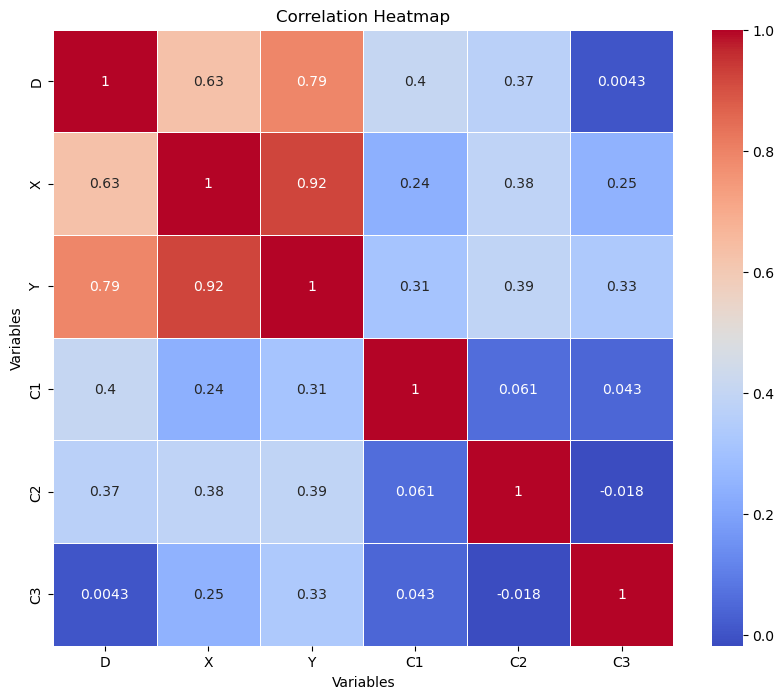

In [59]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create a correlation matrix from the data
corr_matrix = data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Set the title and labels for the heatmap
plt.title('Correlation Heatmap')
plt.xlabel('Variables')
plt.ylabel('Variables')

# Show the heatmap
plt.show()

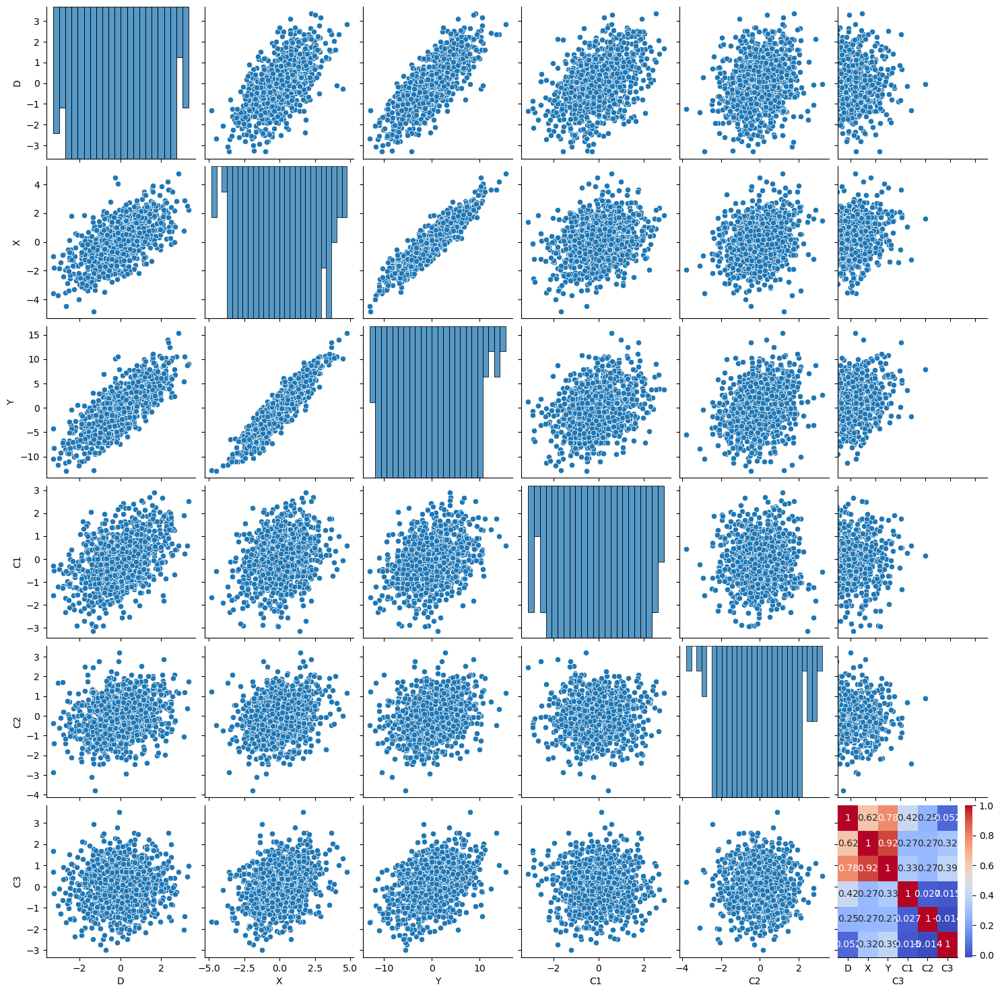

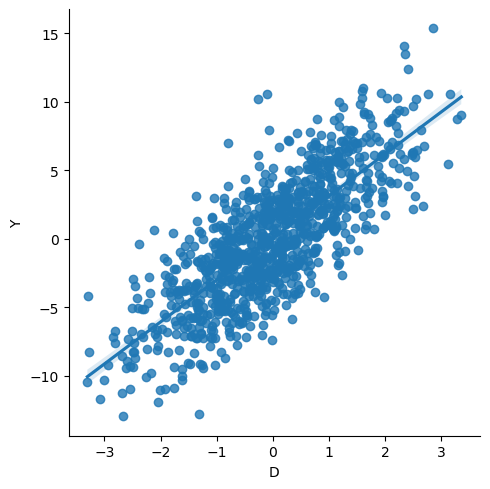

In [35]:
# Create a scatter plot matrix
sns.pairplot(data[['D', 'X', 'Y', 'C1', 'C2', 'C3']])

# Create a heatmap or correlation matrix
corr_matrix = data[['D', 'X', 'Y', 'C1', 'C2', 'C3']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Create a regression plot
sns.lmplot(x='D', y='Y', data=data)

# Show the plots
plt.show()


<Figure size 600x600 with 0 Axes>

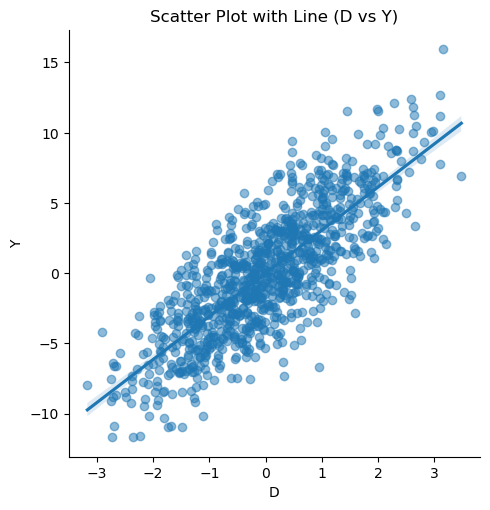

In [60]:
# Create a scatter plot with line

# Create a scatter plot conditioned on X
plt.figure(figsize=(6, 6))
sns.lmplot(x='D', y='Y', data=data, scatter_kws={'alpha': 0.5})

# Set the title and labels for the plot
plt.title('Scatter Plot with Line (D vs Y)')
plt.xlabel('D')
plt.ylabel('Y')

# Show the plot
plt.show()



## Case 2. Synthetic data with Binary variable (Mediator)

In [54]:
# Define the number of samples
num_samples = 1000

# Generate random data for the variables
data = pd.DataFrame()
for node in ['D', 'X', 'Y', 'C1', 'C2', 'C3']:
    data[node] = np.random.normal(0, 1, size=num_samples)

# Set X as a binary variable
data['X'] = np.where((data['D'] + data['C2']) > 0, 1, 0)

# Set the causal relationships based on the DAG edges
data['Y'] = 3 * data['D'] + 2 * data['X'] + 0.5 * data['C2'] + 0.5 * data['C3'] + np.random.normal(0, 1, size=num_samples)

# Print the synthetic data
print(data.head())


          D  X         Y        C1        C2        C3
0  0.277439  0 -0.219407  0.205439 -0.644456 -3.366657
1  0.404908  0  0.520286  0.960620 -2.021106  0.072040
2  0.473040  1  4.188499  0.236805  1.464131 -0.950241
3  0.586302  1  2.715336 -2.030849  1.130093 -1.077429
4  0.383229  1  3.206565  1.478314  2.175415 -0.321289


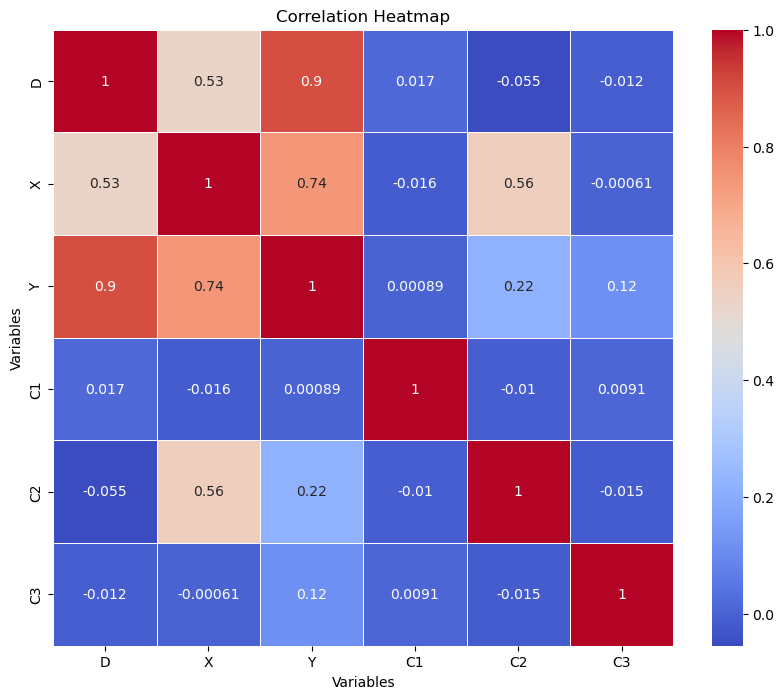

In [55]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create a correlation matrix from the data
corr_matrix = data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Set the title and labels for the heatmap
plt.title('Correlation Heatmap')
plt.xlabel('Variables')
plt.ylabel('Variables')

# Show the heatmap
plt.show()

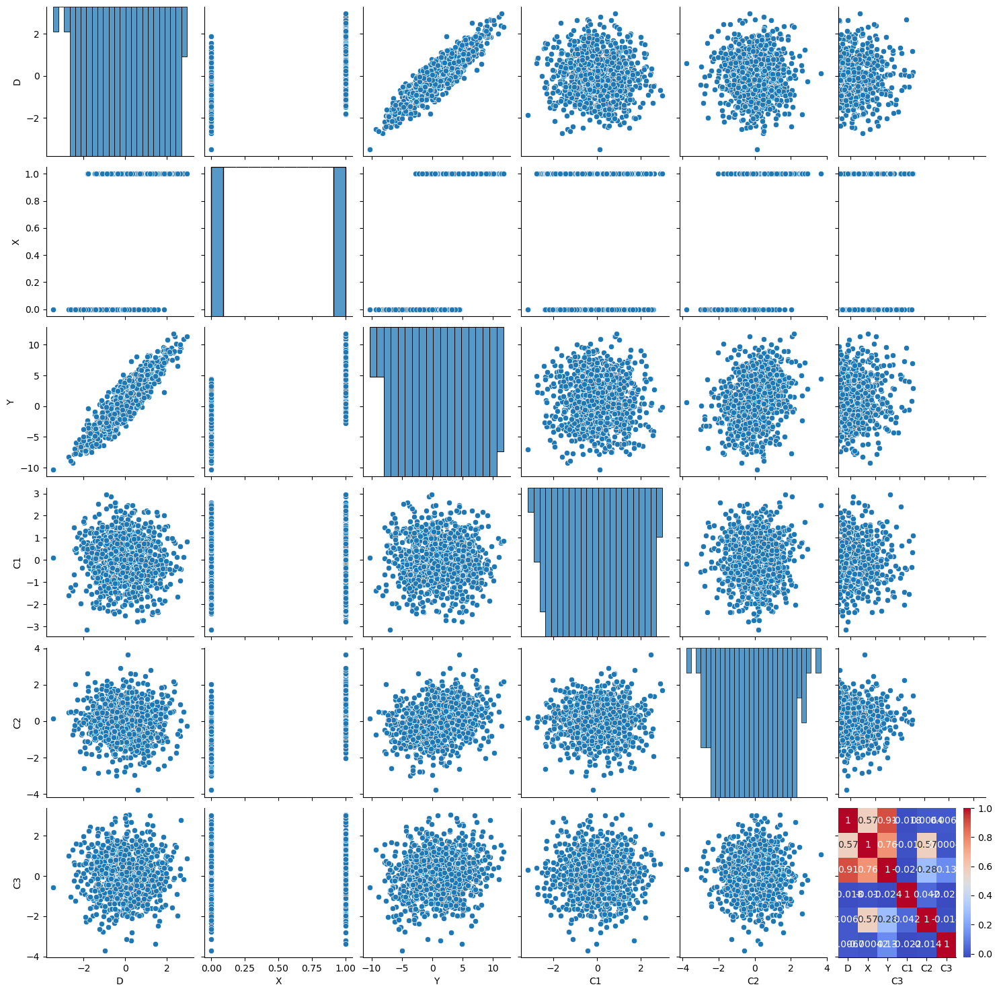

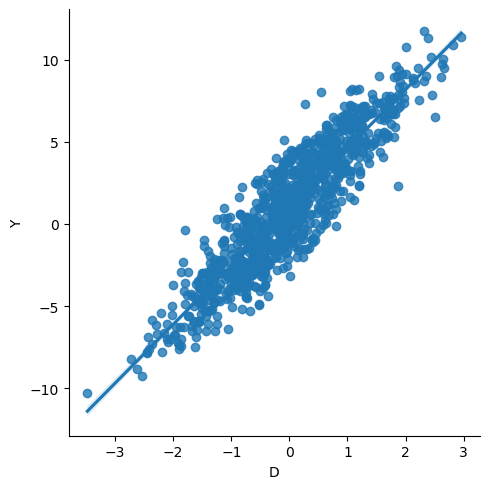

In [39]:
# Create a scatter plot matrix
sns.pairplot(data[['D', 'X', 'Y', 'C1', 'C2', 'C3']])

# Create a heatmap or correlation matrix
corr_matrix = data[['D', 'X', 'Y', 'C1', 'C2', 'C3']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Create a regression plot
sns.lmplot(x='D', y='Y', data=data)

# Show the plots
plt.show()


<Figure size 600x600 with 0 Axes>

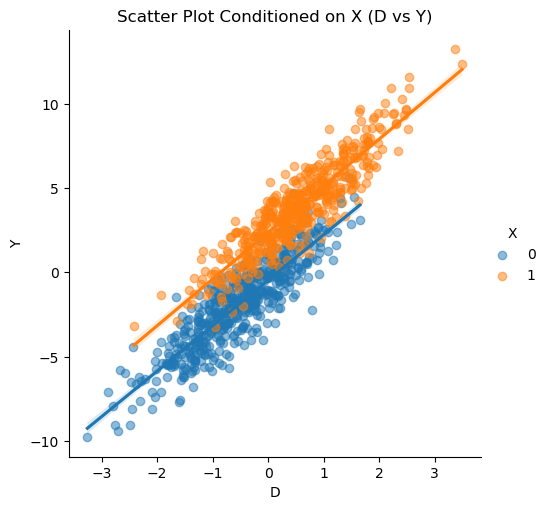

In [56]:
# Create a scatter plot conditioned on X
plt.figure(figsize=(6, 6))
sns.lmplot(x='D', y='Y', data=data, hue='X', scatter_kws={'alpha': 0.5})

# Set the title and labels for the plot
plt.title('Scatter Plot Conditioned on X (D vs Y)')
plt.xlabel('D')
plt.ylabel('Y')

# Show the plot
plt.show()

## Case 3. Synthetic data with binary treatment

In [3]:
# Define the number of samples
num_samples = 1000

# Generate random data for the variables
data = pd.DataFrame()
for node in ['D', 'X', 'Y', 'C1', 'C2', 'C3']:
    data[node] = np.random.normal(0, 1, size=num_samples)

# Set D as a binary treatment variable
data['D'] = np.where((data['C3'] + data['C1'] + data['C2']) > 0, 1, 0)

# Set the causal relationships based on the DAG edges
data['Y'] = 3 * data['D'] + 2 * data['X'] + 0.5 * data['C2'] + 0.5 * data['C3'] + np.random.normal(0, 1, size=num_samples)

# Print the synthetic data
print(data.head())


   D         X         Y        C1        C2        C3
0  1 -0.198533  4.611053  0.807523  1.651966  0.835143
1  1 -1.487688  0.371656 -0.214094 -0.030312  1.678793
2  1  0.222797  3.839647 -0.237436  0.340059  0.554122
3  1 -0.214725  2.703283  0.144027  0.684466  0.222499
4  0 -0.166848 -0.141971  0.835712 -0.489174 -0.366965


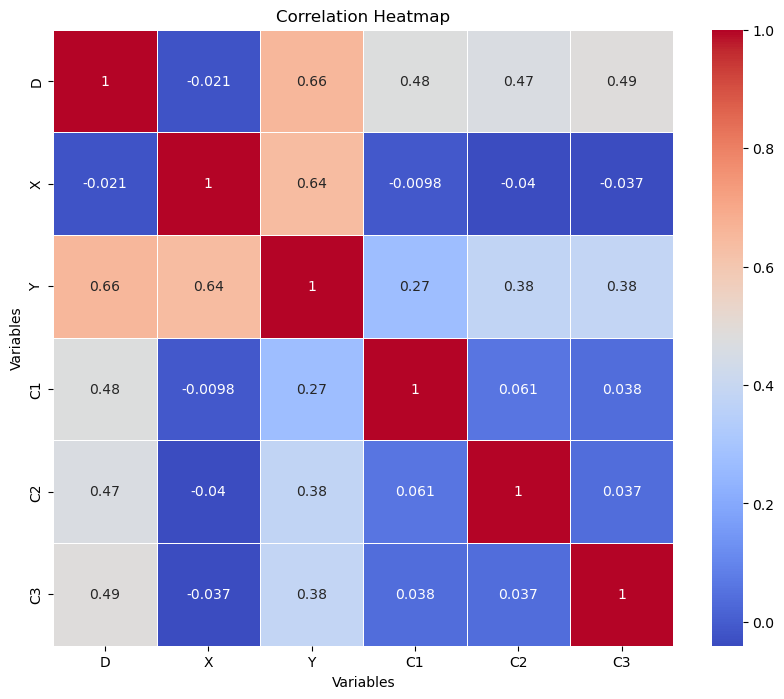

In [42]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create a correlation matrix from the data
corr_matrix = data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Set the title and labels for the heatmap
plt.title('Correlation Heatmap')
plt.xlabel('Variables')
plt.ylabel('Variables')

# Show the heatmap
plt.show()

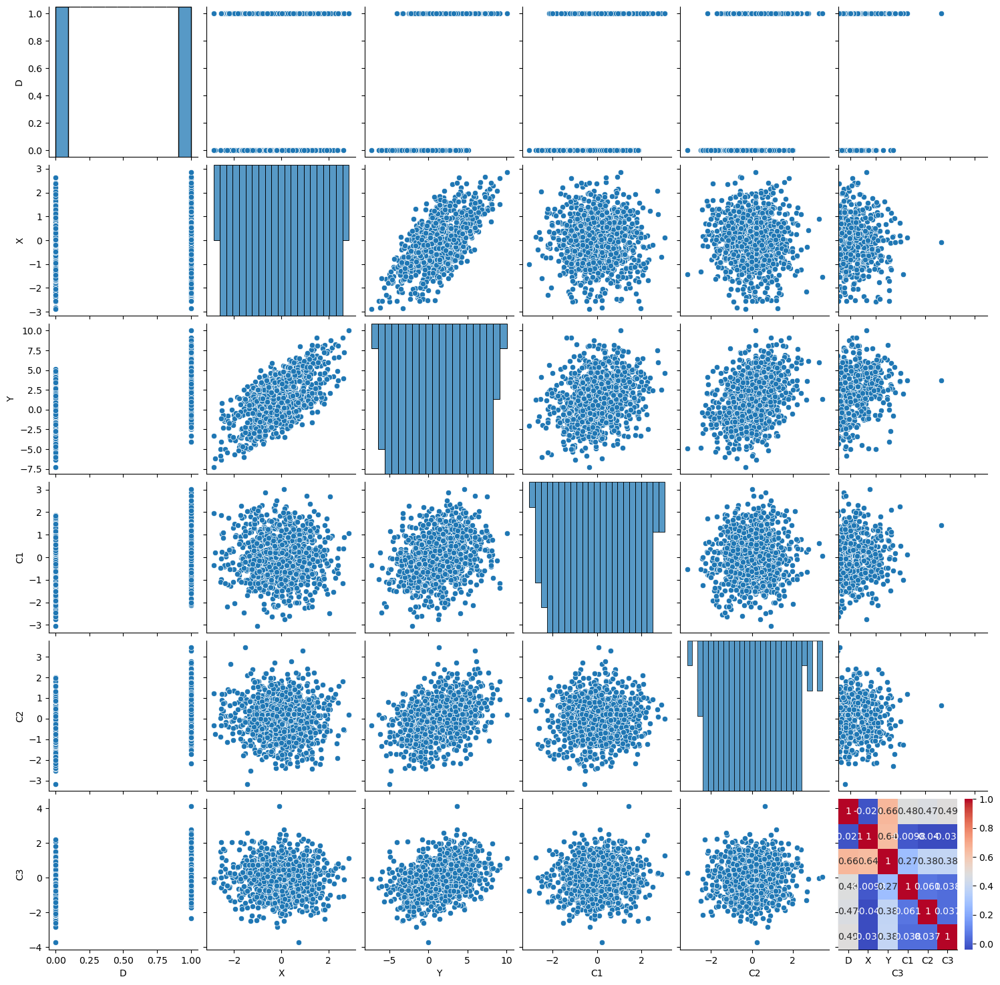

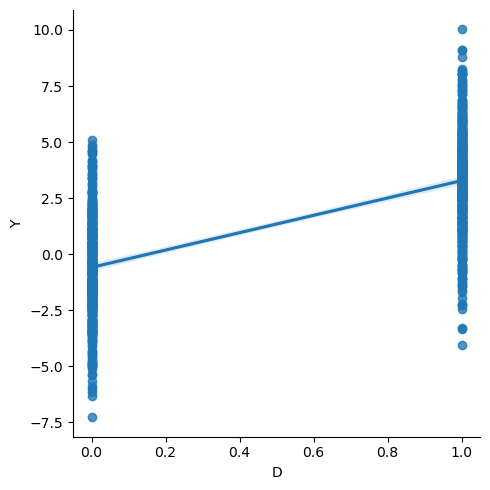

In [43]:
# Create a scatter plot matrix
sns.pairplot(data[['D', 'X', 'Y', 'C1', 'C2', 'C3']])

# Create a heatmap or correlation matrix
corr_matrix = data[['D', 'X', 'Y', 'C1', 'C2', 'C3']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Create a regression plot
sns.lmplot(x='D', y='Y', data=data)

# Show the plots
plt.show()


<Figure size 600x600 with 0 Axes>

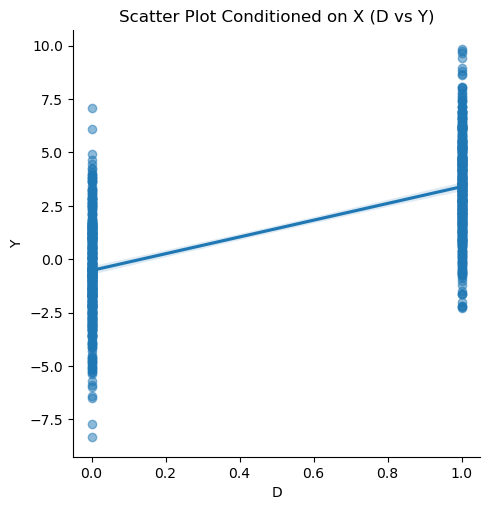

In [62]:
# Create a scatter plot conditioned on X
plt.figure(figsize=(6, 6))
sns.lmplot(x='D', y='Y', data=data, scatter_kws={'alpha': 0.5})

# Set the title and labels for the plot
plt.title('Scatter Plot Conditioned on X (D vs Y)')
plt.xlabel('D')
plt.ylabel('Y')

# Show the plot
plt.show()

## Case 4. Increased Noise

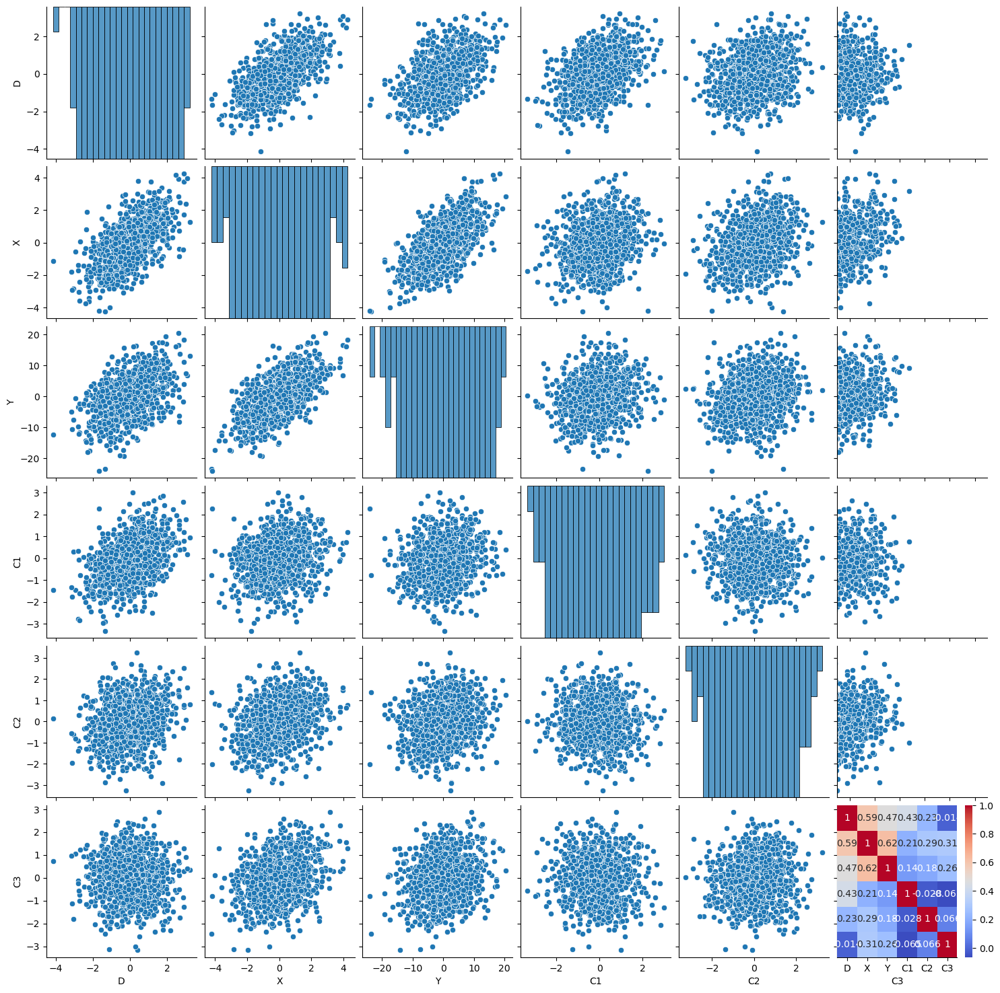

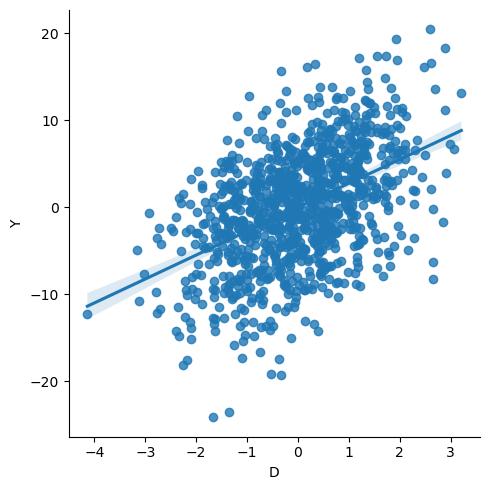

In [64]:
# Define the number of samples
num_samples = 1000

# Case 1 - 1 Continous variables: Increased Noise
# Generate random data for the variables
data = pd.DataFrame()
for node in ['D', 'X', 'Y', 'C1', 'C2', 'C3']:
    data[node] = np.random.normal(0, 1, size=num_samples)
    
# Set the causal relationships based on the DAG edges
data['D'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
data['X'] = 0.7 * data['D'] + 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['Y'] = 1.5 * data['D'] + 2 * data['X'] + 0.8 * data['C3'] + np.random.normal(0, 5, size=num_samples)

# Create a scatter plot matrix
sns.pairplot(data[['D', 'X', 'Y', 'C1', 'C2', 'C3']])

# Create a heatmap or correlation matrix
corr_matrix = data[['D', 'X', 'Y', 'C1', 'C2', 'C3']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Create a regression plot
sns.lmplot(x='D', y='Y', data=data)

# Show the plots
plt.show()


<Figure size 600x600 with 0 Axes>

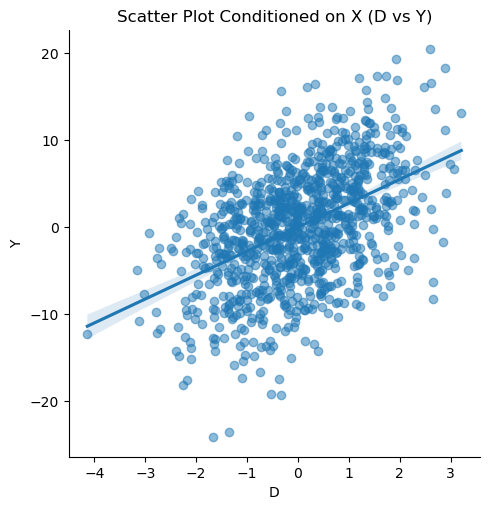

In [65]:
# Create a scatter plot conditioned on X
plt.figure(figsize=(6, 6))
sns.lmplot(x='D', y='Y', data=data, scatter_kws={'alpha': 0.5})

# Set the title and labels for the plot
plt.title('Scatter Plot Conditioned on X (D vs Y)')
plt.xlabel('D')
plt.ylabel('Y')

# Show the plot
plt.show()

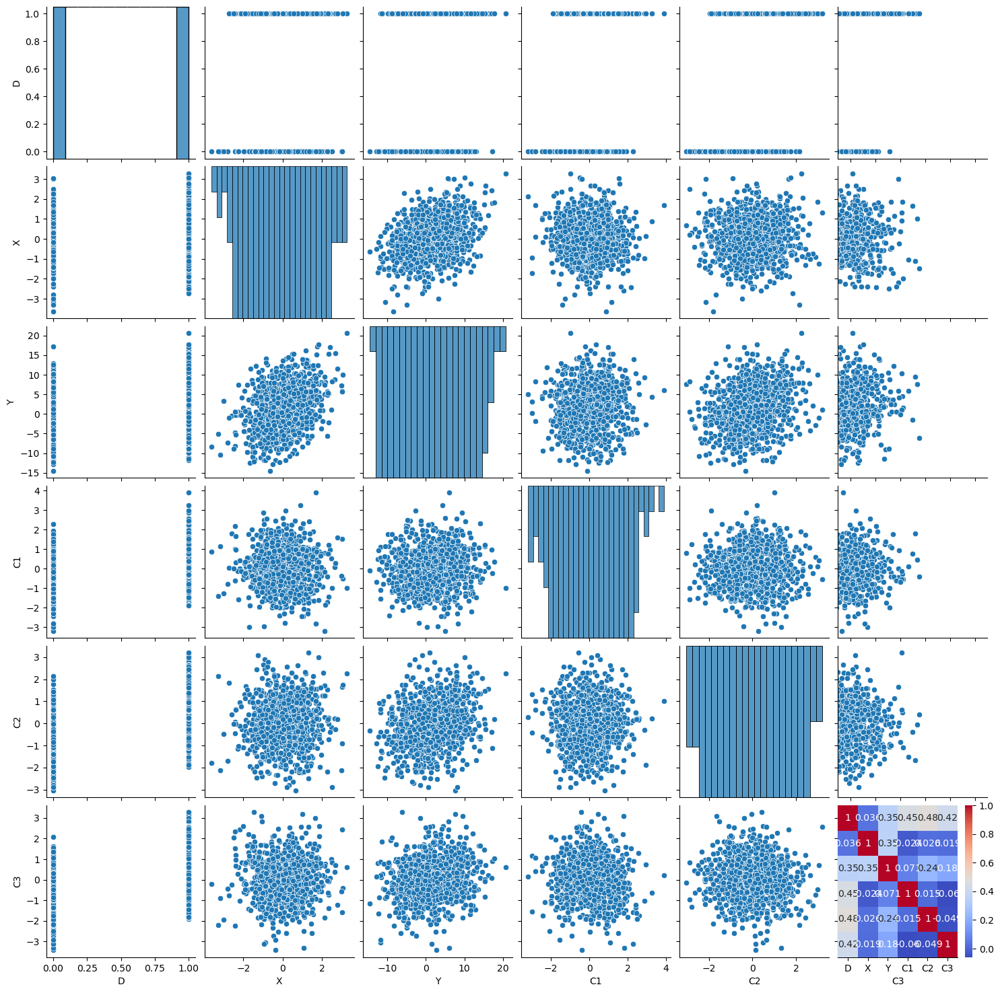

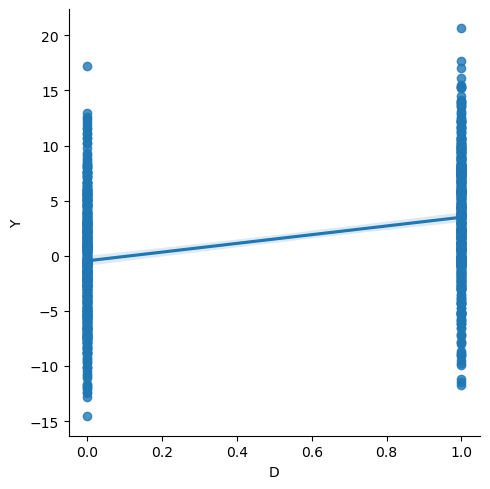

In [66]:
# Case 3 - 1 Continous variables: Increased Noise
# Generate synthetic data with increased noise
data = pd.DataFrame()
for node in ['D', 'X', 'Y', 'C1', 'C2', 'C3']:
    data[node] = np.random.normal(0, 1, size=num_samples)
    
data['D'] = np.where((data['C3'] + data['C1'] + data['C2']) > 0, 1, 0)
data['Y'] = 3 * data['D'] + 2 * data['X'] + 0.5 * data['C2'] + 0.5 * data['C3'] + np.random.normal(0, 5, size=num_samples)

# Create a scatter plot matrix
sns.pairplot(data[['D', 'X', 'Y', 'C1', 'C2', 'C3']])

# Create a heatmap or correlation matrix
corr_matrix = data[['D', 'X', 'Y', 'C1', 'C2', 'C3']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Create a regression plot
sns.lmplot(x='D', y='Y', data=data)

# Show the plots
plt.show()


<Figure size 600x600 with 0 Axes>

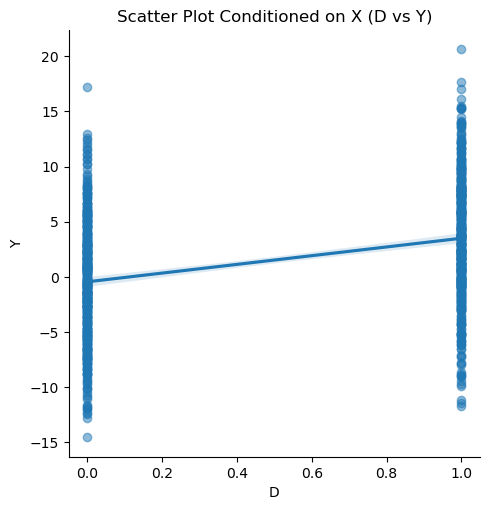

In [67]:
# Create a scatter plot conditioned on X
plt.figure(figsize=(6, 6))
sns.lmplot(x='D', y='Y', data=data, scatter_kws={'alpha': 0.5})

# Set the title and labels for the plot
plt.title('Scatter Plot Conditioned on X (D vs Y)')
plt.xlabel('D')
plt.ylabel('Y')

# Show the plot
plt.show()

## Case 5. Different Data with different Graphs

Delete the D->X

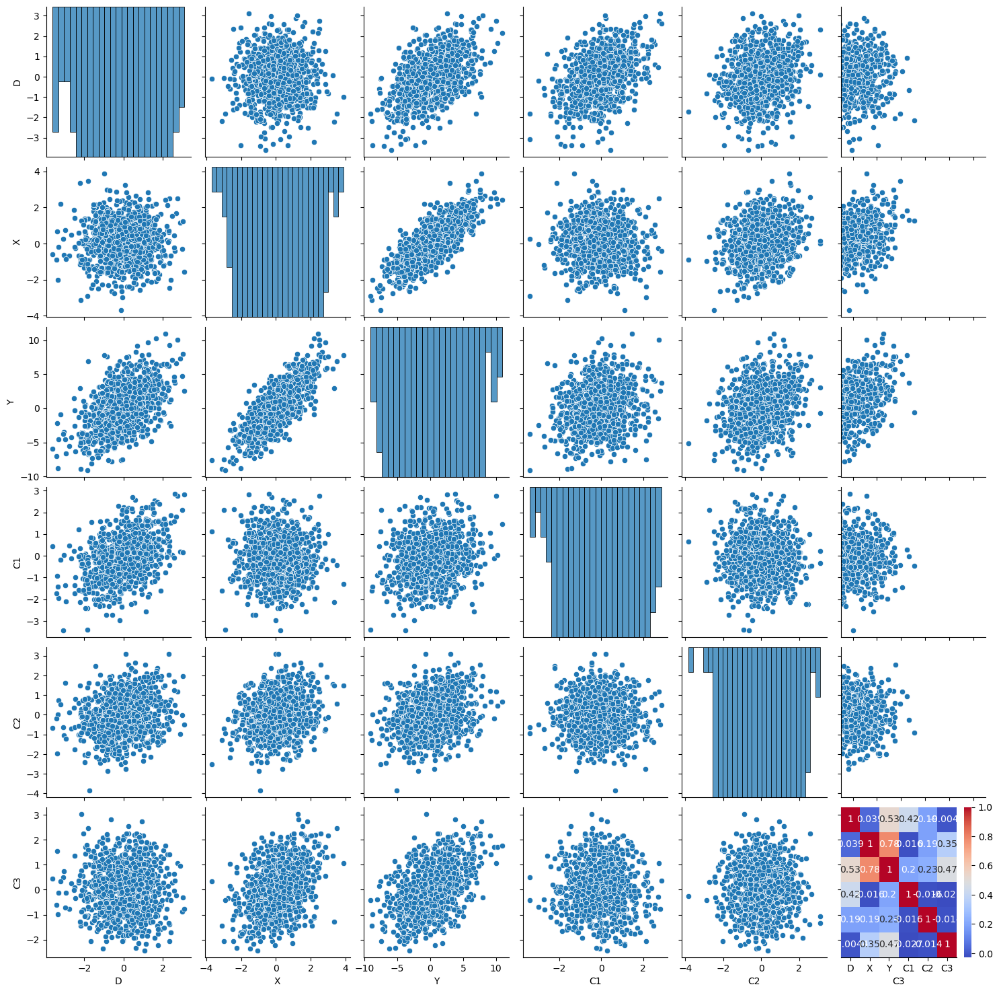

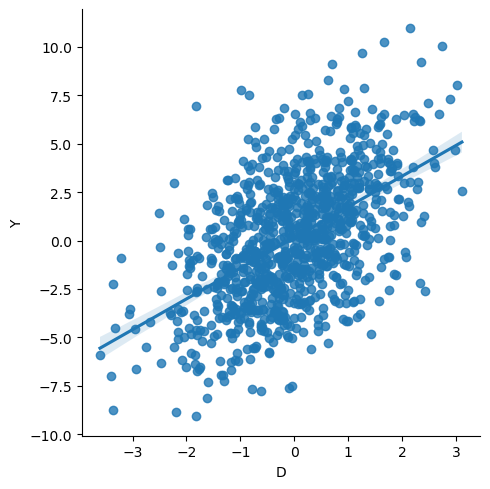

In [68]:
# Define the number of samples
num_samples = 1000

# Generate random data for the variables
data = pd.DataFrame()
for node in ['D', 'X', 'Y', 'C1', 'C2', 'C3']:
    data[node] = np.random.normal(0, 1, size=num_samples)
    
# Set the causal relationships based on the DAG edges
data['D'] = 0.5 * data['C1'] + 0.3 * data['C2'] + np.random.normal(0, 1, size=num_samples)
data['X'] = 0.2 * data['C2'] + 0.4 * data['C3'] + np.random.normal(0, 1, size=num_samples)
data['Y'] = 1.5 * data['D'] + 2 * data['X'] + 0.8 * data['C3'] + np.random.normal(0, 1, size=num_samples)

# Create a scatter plot matrix
sns.pairplot(data[['D', 'X', 'Y', 'C1', 'C2', 'C3']])

# Create a heatmap or correlation matrix
corr_matrix = data[['D', 'X', 'Y', 'C1', 'C2', 'C3']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Create a regression plot
sns.lmplot(x='D', y='Y', data=data)

# Show the plots
plt.show()


<Figure size 600x600 with 0 Axes>

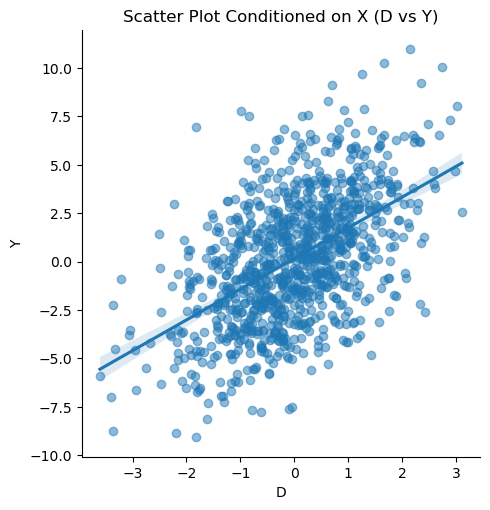

In [69]:
# Create a scatter plot conditioned on X
plt.figure(figsize=(6, 6))
sns.lmplot(x='D', y='Y', data=data, scatter_kws={'alpha': 0.5})

# Set the title and labels for the plot
plt.title('Scatter Plot Conditioned on X (D vs Y)')
plt.xlabel('D')
plt.ylabel('Y')

# Show the plot
plt.show()

# 3. Causal Inference Model

Linear Regression Model:
A linear regression model is a statistical model that assumes a linear relationship between the input variables (independent variables) and the output variable (dependent variable). It can be used for causal inference by including relevant variables as predictors in the model.
In Python, you can use libraries such as statsmodels or scikit-learn to fit linear regression models and estimate causal effects.
Instrumental Variable Model:
An instrumental variable (IV) model is used to estimate causal effects in the presence of endogeneity, where the treatment variable is correlated with unobserved confounders. IV models utilize instrumental variables, which are variables that affect the treatment but are unrelated to the outcome except through their effect on the treatment.
In Python, statsmodels provides support for instrumental variable estimation, specifically through the IV2SLS class.
Structural Equation Modeling (SEM):
SEM is a statistical modeling technique that allows for the estimation of causal relationships between variables by specifying a set of structural equations. It considers both observed and unobserved variables and their relationships to estimate the underlying causal structure.
Python libraries such as statsmodels, semopy, or lavaan provide functionality for fitting SEM models and estimating causal effects.
Bayesian Networks:
Bayesian networks are graphical models that represent causal relationships between variables using directed acyclic graphs (DAGs) and conditional probability distributions. They allow for probabilistic reasoning and can be used to estimate causal effects by propagating information through the graph.
In Python, libraries such as pgmpy or pomegranate provide functionality for creating and analyzing Bayesian networks.

Linear Regression Model:
Reason: Linear regression is a widely used and interpretable model that can capture the linear relationships between variables. It would be suitable for analyzing the direct causal effect of 'X' on 'Y' and the direct effect of 'D' on 'Y' in this synthetic data.
Instrumental Variable Model:
Reason: The presence of instrumental variables ('c1', 'c2', 'c3', 'c4', 'c5') in the causal graph suggests the potential for endogeneity or confounding bias. Using an instrumental variable model can help address these issues by leveraging these instrumental variables to estimate causal effects. It would be appropriate to estimate the causal effect of 'D' on 'Y' while accounting for the confounding variables.
Structural Equation Model (SEM):
Reason: SEM is a flexible modeling approach that allows for the estimation of direct and indirect causal effects in a system of multiple variables. Given the complex causal graph structure in the synthetic data, SEM can provide insights into the causal relationships between 'X', 'D', and 'Y' and capture the indirect effects mediated through other variables.
Bayesian Networks:
Reason: Bayesian networks provide a probabilistic graphical model to represent the dependencies among variables and estimate causal effects. With the given causal graph structure, Bayesian networks can capture the probabilistic relationships between 'X', 'D', and 'Y' and allow for inference of the causal effects and conditional probabilities.

[('X', 'Z'), ('X', 'Y'), ('X', 'K'), ('X', 'M'), ('X', 'L'), ('Z', 'X'), ('Z', 'Y'), ('Z', 'K'), ('Z', 'M'), ('Z', 'L'), ('Y', 'X'), ('Y', 'Z'), ('Y', 'K'), ('Y', 'M'), ('Y', 'L'), ('K', 'X'), ('K', 'Z'), ('K', 'Y'), ('K', 'M'), ('K', 'L'), ('M', 'X'), ('M', 'Z'), ('M', 'Y'), ('M', 'K'), ('M', 'L'), ('L', 'X'), ('L', 'Z'), ('L', 'Y'), ('L', 'K'), ('L', 'M')]


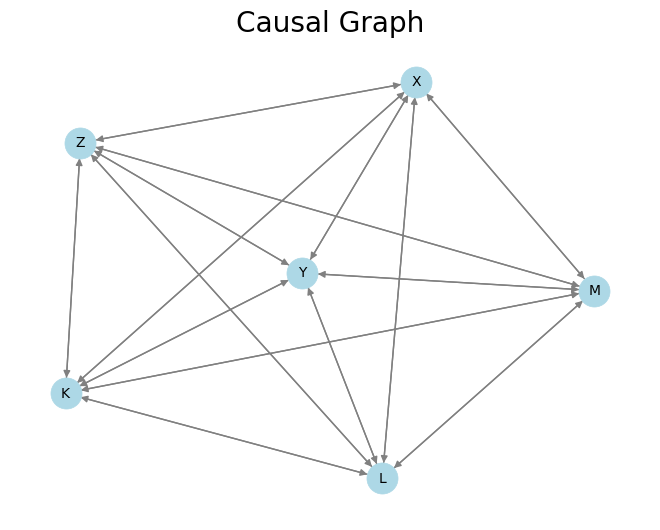

In [41]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from causalnex.structure import StructureModel
from causalnex.structure.notears import from_pandas

# Read the Excel file into a pandas DataFrame
df = data

# Perform causal discovery using the PC algorithm
sm = from_pandas(df)

# Print the edges of the inferred causal graph
print(sm.edges())

# Create a directed graph from the inferred causal graph
G = nx.DiGraph(sm.edges())

# Visualize the graph
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, font_size=10, edge_color='gray', arrows=True)
plt.title("Causal Graph")
plt.show()

In [38]:
import numpy as np
import pandas as pd
from pgmpy.estimators import PC
from pgmpy.estimators import BDeuScore, K2Score, BicScore
from pgmpy.models import BayesianModel

# Initializing the PC estimator
c = PC(data=data)

# Estimating the DAG
model = c.estimate(variant='stable', max_cond_vars=3)

# Print the edges of the final DAG
print(model.edges())


  0%|          | 0/3 [00:00<?, ?it/s]

[]


In [63]:
data.describe()

,X,Z,Y,K,M,L,intercept
count,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,10000000.0
mean,6.460049e-05,1.712849e-01,-1.248575e-04,-5.168168e-06,1.318491e-04,7.500179e+00,1.0
std,9.999915e-01,3.767577e-01,9.999933e-01,9.999216e-01,9.999768e-01,6.439595e+00,0.0
min,-5.053086e+00,0.000000e+00,-5.181951e+00,-5.219773e+00,-5.009094e+00,-2.686541e+01,1.0
25%,-6.743613e-01,0.000000e+00,-6.748932e-01,-6.744453e-01,-6.744616e-01,3.156661e+00,1.0
50%,1.732163e-04,0.000000e+00,-2.389216e-04,-3.702766e-04,2.403215e-04,7.503103e+00,1.0
75%,6.747017e-01,0.000000e+00,6.744308e-01,6.744754e-01,6.750543e-01,1.184133e+01,1.0
max,4.974006e+00,1.000000e+00,4.984816e+00,5.287952e+00,5.139283e+00,4.113806e+01,1.0


In [68]:
data['Z']= np.where(data['Z'] > 6, 1 , 0 )
data['L']= np.where(data['L'] > 7.503103e+00, 1 , 0 )

In [69]:
data

,X,Z,Y,K,M,L
0,-1.451117,0,0.866534,-0.237534,0.458114,0
1,0.498522,0,0.182425,-0.966688,0.721935,1
2,-1.159211,0,0.061226,-0.765563,0.749167,0
3,1.312513,0,-1.301249,0.456861,0.042553,1
4,0.920594,0,-2.280370,-0.088676,0.738562,0
...,...,...,...,...,...,...
9999995,-0.858165,0,-0.371067,0.697445,-0.520343,0
9999996,-0.859694,0,0.645498,1.232066,-1.076299,1
9999997,1.930703,0,-0.639285,-0.813817,1.803590,1
9999998,-0.194616,0,-1.247189,0.135594,-1.406576,0


In [70]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model = model.fit (data[['Z']], data[['L']])

data0=data.copy()
data0['Z'] = 0
y_pred_0 = model.predict_proba(data0[['Z']])

data1=data.copy()
data1['Z'] = 1 
y_pred_1 = model.predict_proba(data1[['Z']])

y_pred_1[:,1].mean() - y_pred_0[:,1].mean()

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


## 1. DoWhy

### Without explicitly provide the causal graph

In [64]:
import dowhy
from dowhy import CausalModel

# Define the causal graph 
causal_graph = """digraph {
    Thickness -> Remaining_Life;
    Corrosion_Rate -> Remaining_Life; 
    Age -> Remaining_Life; 
    Anode_life -> Remaining_Life; 
    T -> Remaining_Life;
    Required_Thickness -> Remaining_Life;
    
    Initial_Thickness -> Corrosion_Rate; 
    Thickness -> Corrosion_Rate;  
    Age -> Corrosion_Rate; 
    Anode_life -> Corrosion_Rate;  
    T -> Corrosion_Rate;
    
    Initial_Thickness -> Thickness;
    Anode_life -> Thickness; 
    T -> Thickness;
    Age -> Thickness;
    
    Material -> Allowable_Stress;
    
    Pressure -> Required_Thickness;
    OD -> Required_Thickness;
    Allowable_Stress -> Required_Thickness
}"""

# Define the causal model
model = CausalModel(
    data=data,  # Your data
    treatment='Anode_life',  # Treatment variable
    outcome='Remaining_Life',  # Outcome variable
    graph=causal_graph,
    #instruments='Initial_Thickness',
    #common_causes=['Thickness', 'Age', 'Corrosion_Rate'], # List of common causes, 
    mediator ='Corrosion_Rate' ### Dowhy does not keep this as the part of DAG
)

model.view_model(layout="dot")


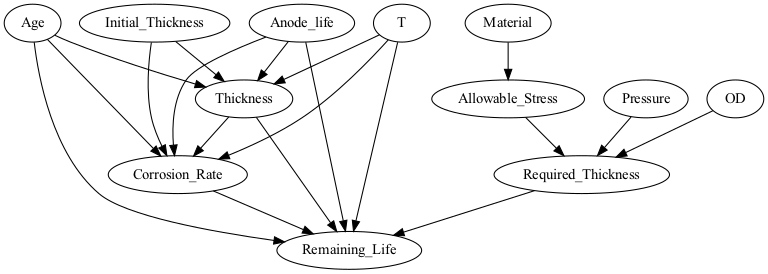

In [65]:
from IPython.display import Image, display
display(Image(filename="causal_model.png"))

In [62]:
# Learn the causal graph if not already learned
#model.learn_graph()

# Get the causal graph from the model
causal_graph = model.get_graph()

# Get the edges from the causal graph
edges = causal_graph.edges()

# Print the edges
print(edges)

AttributeError: 'CausalModel' object has no attribute 'get_graph'

In [33]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
─────────────(E[Remaining_Life])
d[Anode_life]                   
Estimand assumption 1, Unconfoundedness: If U→{Anode_life} and U→Remaining_Life then P(Remaining_Life|Anode_life,,U) = P(Remaining_Life|Anode_life,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [ ]:
import math
import dowhy.datasets, dowhy.plotter

#dowhy.plotter.plot_treatment_outcome(data['T'], data['Remaining_Life'], data['L'])
dowhy.plotter.plot_treatment_outcome(data['T'], data['Remaining_Life'], data['time_val'])

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
─────────────(E[Remaining_Life])
d[Anode_life]                   
Estimand assumption 1, Unconfoundedness: If U→{Anode_life} and U→Remaining_Life then P(Remaining_Life|Anode_life,,U) = P(Remaining_Life|Anode_life,)

## Realized estimand
b: Remaining_Life~Anode_life
Target units: ate

## Estimate
Mean value: 1.2967646668978987

Causal Estimate is 1.2967646668978987


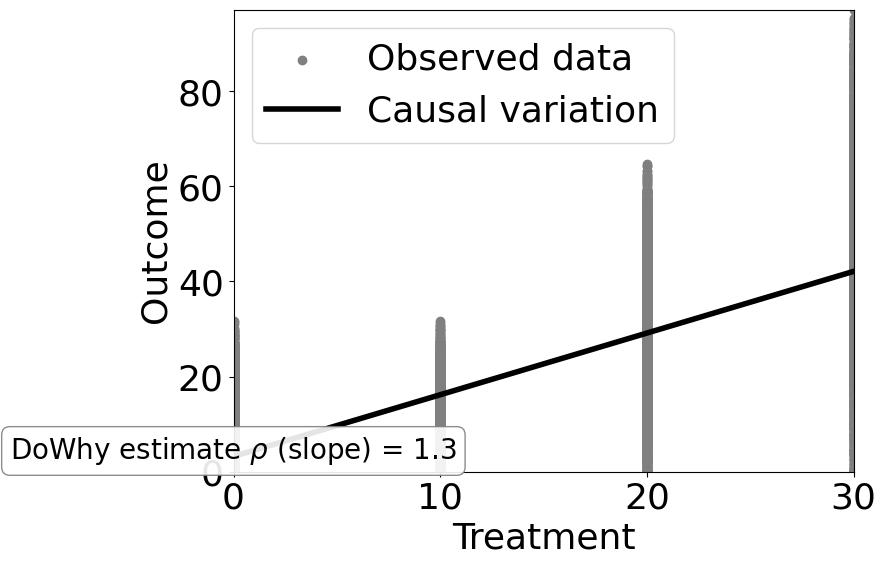

In [38]:
estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression")
print(estimate)
print("Causal Estimate is " + str(estimate.value))

# Plot Slope of line between action and outcome = causal effect
dowhy.plotter.plot_causal_effect(estimate, data['Anode_life'], data['Remaining_Life'])

In [39]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor

dml_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.dml.DML",
                                     control_value = 0,
                                     treatment_value = 1,
                                     confidence_intervals=False,
                                     method_params={"init_params":{'model_y':GradientBoostingRegressor(),
                                                                   'model_t': GradientBoostingRegressor(),
                                                                   "model_final":LassoCV(fit_intercept=False),
                                                                   'featurizer':PolynomialFeatures(degree=2, include_bias=True)},
                                                    "fit_params":{}})
print(dml_estimate)

/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def delta_minimization_

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
─────────────(E[Remaining_Life])
d[Anode_life]                   
Estimand assumption 1, Unconfoundedness: If U→{Anode_life} and U→Remaining_Life then P(Remaining_Life|Anode_life,,U) = P(Remaining_Life|Anode_life,)

## Realized estimand
b: Remaining_Life~Anode_life | 
Target units: ate

## Estimate
Mean value: 1.2956629179539374
Effect estimates: [[1.29566292]]



A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [40]:
# Identify the causal effect
identified_estimand = model.identify_effect()

# Estimate the causal effect using linear regression adjustment
estimate = model.estimate_effect(identified_estimand,
                                 method_name='backdoor.linear_regression',
                                 control_value=0,
                                 treatment_value = 1,
                                 target_units="att"
                                 )

print(estimate)

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
─────────────(E[Remaining_Life])
d[Anode_life]                   
Estimand assumption 1, Unconfoundedness: If U→{Anode_life} and U→Remaining_Life then P(Remaining_Life|Anode_life,,U) = P(Remaining_Life|Anode_life,)

## Realized estimand
b: Remaining_Life~Anode_life
Target units: att

## Estimate
Mean value: 1.2967646668978987



In [41]:
refutel=model.refute_estimate(identified_estimand, estimate, "random_common_cause")
print(refutel)

Refute: Add a random common cause
Estimated effect:1.2967646668978987
New effect:1.2967593901937389
p value:1.0



In [42]:
refutel=model.refute_estimate(identified_estimand, estimate, "data_subset_refuter")
print(refutel)

Refute: Use a subset of data
Estimated effect:1.2967646668978987
New effect:1.2951610597270033
p value:0.8400000000000001



In [43]:
refutel=model.refute_estimate(identified_estimand, estimate, "placebo_treatment_refuter")
print(refutel)

Refute: Use a Placebo Treatment
Estimated effect:1.2967646668978987
New effect:0.0014761710062879629
p value:0.94



In [44]:
# Output the causal effect
print("Causal effect estimate:", estimate.value)
print("Causal effect confidence intervals:")
confidence_intervals = estimate.get_confidence_intervals()
for i in range(len(confidence_intervals)):
    print("Interval", i+1)
    print("Lower bound:", confidence_intervals[i])
    print("Upper bound:", confidence_intervals[i])

Causal effect estimate: 1.2967646668978987
Causal effect confidence intervals:
Interval 1
Lower bound: [1.26889107 1.32463826]
Upper bound: [1.26889107 1.32463826]


In [67]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm

# Causal effect estimate and confidence intervals
causal_effect_estimate = estimate.value
causal_effect_confidence_intervals = estimate.get_confidence_intervals()
lower_bound = causal_effect_confidence_intervals[0][0]
upper_bound = causal_effect_confidence_intervals[0][1]

# Generate data for the bell curve
x = np.linspace(causal_effect_estimate - 3 * (upper_bound - lower_bound), causal_effect_estimate + 3 * (upper_bound - lower_bound), 100)
y = norm.pdf(x, causal_effect_estimate, (upper_bound - lower_bound) / 1.96)

# Plot the confidence interval bell graph
plt.figure(figsize=(8, 6))
plt.plot(x, y, color='blue', label='Causal Effect Estimate')
plt.fill_between(x, y, 0, where=(x >= lower_bound) & (x <= upper_bound), color='gray', alpha=0.2, label='95% CI')
plt.axvline(causal_effect_estimate, color='blue', linestyle='--')
plt.axvline(lower_bound, color='red', linestyle=':')
plt.axvline(upper_bound, color='green', linestyle=':')
plt.xticks(fontsize=12)
plt.yticks([])
plt.xlabel('Causal Effect', fontsize=14)
plt.title('Causal Effect Estimate with 95% Confidence Interval', fontsize=16)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


IndexError: invalid index to scalar variable.

The estimated causal effect is 2.937 with a 95% confidence interval ranging from 2.802 to 3.072. 

Interpreting the results, we can say that there is a significant causal effect of the treatment variable (D) on the outcome variable (Y). The estimated causal effect of 2.937 suggests that on average, a unit increase in the treatment variable (D) leads to an increase in the outcome variable (Y) by approximately 2.937 units. 

The confidence interval provides a range of plausible values for the true causal effect. With a 95% confidence level, we can say that we are 95% confident that the true causal effect falls within the range of 2.802 to 3.072. This suggests a relatively precise estimate of the causal effect, with a narrow confidence interval.

It's important to note that the interpretation of the causal effect should be done in the context of your specific domain and research question. Additionally, this interpretation assumes that the underlying assumptions of the causal model, such as no unmeasured confounding and no violations of the identification assumptions, are satisfied.

#### Measurement 

In [85]:
import numpy as np
from sklearn.metrics import mean_squared_error

# Define the estimated causal effect from DoWhy
estimated_causal_effect = estimate.value

# Generate synthetic data with known ground truth
ground_truth_causal_effect = 0.8  # Define the known causal effect from your synthetic data

# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error([ground_truth_causal_effect], [estimated_causal_effect])
print("Mean Squared Error (MSE):", mse)


Mean Squared Error (MSE): 4.567176882011861


In [9]:
import numpy as np
import time

# Perform bootstrap resampling
num_samples = 100  # Number of bootstrap samples
estimated_causal_effects = []

start_time = time.time()

for _ in range(num_samples):
    # Perform bootstrap resampling of the data and estimate causal effect
    bootstrap_sample = data.sample(n=len(data), replace=True)  # Bootstrap resampling
    causal_estimate = model.estimate_effect(identified_estimand, method_name='backdoor.linear_regression', test_significance=True)  # Estimate causal effect using DoWhy
    estimated_causal_effect = causal_estimate.value
    estimated_causal_effects.append(estimated_causal_effect)

end_time = time.time()

# Compute the variability of the estimated causal effects
variability = np.std(estimated_causal_effects)
print("Variability of the estimated causal effects:", variability)

# Compute the computation time
computation_time = end_time - start_time
print("Computation time:", computation_time, "seconds")


Variability of the estimated causal effects: 3.552713678800501e-15
Computation time: 5.129561901092529 seconds


#### https://github.com/py-why/dowhy/blob/main/docs/source/example_notebooks/dowhy-conditional-treatment-effects.ipynb 

In [105]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor

dml_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.dml.DML",
                                     control_value = 0,
                                     treatment_value = 1,
                                     target_units = lambda df: df["Corrosion_Rate"]>0.5,  # condition used for CATE
                                     confidence_intervals=False,
                                     method_params={"init_params":{'model_y':GradientBoostingRegressor(),
                                                              'model_t': GradientBoostingRegressor(),
                                                              "model_final":LassoCV(fit_intercept=False), 
                                                              'featurizer':PolynomialFeatures(degree=1, include_bias=False)},
                                               "fit_params":{}})
print(dml_estimate)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
─────────────(E[Remaining_Life])
d[Anode_life]                   
Estimand assumption 1, Unconfoundedness: If U→{Anode_life} and U→Remaining_Life then P(Remaining_Life|Anode_life,,U) = P(Remaining_Life|Anode_life,)

## Realized estimand
b: Remaining_Life~Anode_life | Required_Thickness,OD,Age,T,Allowable_Stress,Initial_Thickness,Pressure
Target units: Data subset defined by a function

## Estimate
Mean value: 1.8056606169287674
Effect estimates: [[0.96232226]
 [1.02022849]
 [2.20993661]
 ...
 [2.22633753]
 [2.14690656]
 [2.23777839]]



In [107]:
dml_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.dml.DML",
                                     control_value = 0,
                                     treatment_value = 1,
                                 target_units = 1,  # condition used for CATE
                                 confidence_intervals=False,
                                method_params={"init_params":{'model_y':GradientBoostingRegressor(),
                                                              'model_t': GradientBoostingRegressor(),
                                                              "model_final":LassoCV(fit_intercept=False), 
                                                              'featurizer':PolynomialFeatures(degree=1, include_bias=True)},
                                               "fit_params":{}})
print(dml_estimate)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
─────────────(E[Remaining_Life])
d[Anode_life]                   
Estimand assumption 1, Unconfoundedness: If U→{Anode_life} and U→Remaining_Life then P(Remaining_Life|Anode_life,,U) = P(Remaining_Life|Anode_life,)

## Realized estimand
b: Remaining_Life~Anode_life | Required_Thickness,OD,Age,T,Allowable_Stress,Initial_Thickness,Pressure
Target units: 

## Estimate
Mean value: 1.8102712682485356
Effect estimates: [[2.35029975]
 [2.21766759]
 [2.17608035]
 ...
 [2.15558395]
 [2.31610738]
 [2.24793664]]



In [108]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
from econml.inference import BootstrapInference
dml_estimate = model.estimate_effect(identified_estimand, 
                                     method_name="backdoor.econml.dml.DML",
                                     target_units = "ate",
                                     confidence_intervals=True,
                                     method_params={"init_params":{'model_y':GradientBoostingRegressor(),
                                                              'model_t': GradientBoostingRegressor(),
                                                              "model_final": LassoCV(fit_intercept=False), 
                                                              'featurizer':PolynomialFeatures(degree=1, include_bias=True)},
                                               "fit_params":{
                                                               'inference': BootstrapInference(n_bootstrap_samples=100, n_jobs=-1),
                                                            }
                                              })
print(dml_estimate)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please cha

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
─────────────(E[Remaining_Life])
d[Anode_life]                   
Estimand assumption 1, Unconfoundedness: If U→{Anode_life} and U→Remaining_Life then P(Remaining_Life|Anode_life,,U) = P(Remaining_Life|Anode_life,)

## Realized estimand
b: Remaining_Life~Anode_life | Required_Thickness,OD,Age,T,Allowable_Stress,Initial_Thickness,Pressure
Target units: ate

## Estimate
Mean value: 1.8010531397282203
Effect estimates: [[2.33825814]
 [2.20267024]
 [2.16015622]
 ...
 [2.13920305]
 [2.30330378]
 [2.23361384]]



In [ ]:
test_cols= data['effect_modifier_names'] # only need effect modifiers' values
test_arr = [np.random.uniform(0,1, 10) for _ in range(len(test_cols))] # all variables are sampled uniformly, sample of 10
test_df = pd.DataFrame(np.array(test_arr).transpose(), columns=test_cols)
dml_estimate = model.estimate_effect(identified_estimand, 
                                     method_name="backdoor.econml.dml.DML",
                                     target_units = test_df,
                                     confidence_intervals=False,
                                     method_params={"init_params":{'model_y':GradientBoostingRegressor(),
                                                              'model_t': GradientBoostingRegressor(),
                                                              "model_final":LassoCV(), 
                                                              'featurizer':PolynomialFeatures(degree=1, include_bias=True)},
                                               "fit_params":{}
                                              })
print(dml_estimate.cate_estimates)

##### "Shifting Intervention" on a Structural Causal Model (SCM)

In [19]:
from dowhy import gcm
import networkx as nx

scm0 = gcm.StructuralCausalModel(nx.DiGraph([('Z', 'L')]))

scm0.set_causal_mechanism('Z', gcm.EmpiricalDistribution())
scm0.set_causal_mechanism('L', gcm.AdditiveNoiseModel(gcm.ml.create_linear_regressor()))

scm0.causal_mechanism("L")

In [20]:
gcm.fit(scm0, data[['Z', 'L']])

Fitting causal mechanism of node L: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s]


In [16]:
!pip install tabulate

In [22]:
from tabulate import tabulate


def do_intervention_atomic(model, covariate, value):
    "Make an intervension by setting a covariate to a given VALUE"
    return gcm.interventional_samples(
        model,
        {covariate: lambda x:value},
        num_samples_to_draw=149
    )
    
print("Atomic Intervention: Set Value S=n")

def flatten(lst):
    return [item for sublist in lst for item in sublist]


sample_df01 = data[['Z', 'L']].sample(
    n=3, random_state=10101, ignore_index=False).copy()
sample_indicies01 = sample_df01.index.copy()

position = sample_indicies01.tolist().index(i)
row.append(result.iloc[position].to_list())


table01=[]
for i in sample_indicies01:
    position = sample_indicies01.tolist().index(i)
    row = [[i]]
    for v in (-1, 0, 5, 9.06, 12):
        if v != -1:
            result = do_intervention_atomic(scm0, "Z", v)
            row.append(result.iloc[position].to_list())
        else:
            row.append(data[['Z', 'L']].iloc[i].to_list())
    table01.append(flatten(row))

    
print(tabulate(
    table01,
    headers=['i', 'Z_orig', 'L_orig', 'Z=0', 'L_0', 'Z=5', 'L_5', 'Z=9.6', 'L_9.6', 'Z=12', 'Z_12']
))

Atomic Intervention: Set Value S=n
      i     Z_orig    L_orig    Z=0        L_0    Z=5      L_5    Z=9.6    L_9.6    Z=12     Z_12
-------  ---------  --------  -----  ---------  -----  -------  -------  -------  ------  -------
5687937   4.95816    7.13119      0  -0.738518      5  12.1648     9.06  20.1472      12  24.0669
3103764   0.496176   4.07561      0   1.16894       5  12.1569     9.06  18.6828      12  24.9255
3320700  -1.17595   -2.06803      0   7.17044       5  13.837      9.06  19.4056      12  28.8486


In [36]:
from functools import partial
import pandas as pd

def do_intervention_shift(model, covariate, func):
    "Make an intervention by setting a covariate by a given FUNCTION"
    return gcm.interventional_samples(
        model,
        {covariate: func},
        num_samples_to_draw=1000
    )

def multiply_by(value, multiplier):
    return value * multiplier

sample_df01 = data[['Z', 'L']].sample(
    n=3, random_state=10101, ignore_index=False).copy()
sample_indicies01 = sample_df01.index.copy()

print("Shifting Intervention: increase by a percentage")

table02 = []
for i in sample_indicies01:
    position = sample_indicies01.tolist().index(i)
    row = [i]
    for v in (1, 1.1, 1.2, 1.3):  # 1 is added to include original values as well
        intervention_result = do_intervention_shift(scm0, "Z", partial(multiply_by, multiplier=v))
        # Use position instead of i to get the correct row from intervention_result
        row.extend(intervention_result.iloc[position].to_list())
    table02.append(row)

print(tabulate(
    table02,
    headers=["i", "Z_orig", "L_orig", "Z_10%", "L_10%",
             "Z_20%", "L_20%", "Z_30%", "L_30%"]))


Shifting Intervention: increase by a percentage
      i    Z_orig     L_orig     Z_10%      L_10%    Z_20%     L_20%     Z_30%     L_30%
-------  --------  ---------  --------  ---------  -------  --------  --------  --------
5687937   3.29618   6.01892   -2.38551  -0.315297  6.32132  15.195    -3.59188  -3.47984
3103764  -0.72674  -0.915099   4.26417   8.70816   4.53269   9.58687   1.02249   1.86792
3320700   4.26362   8.83083    6.91181  17.8217    4.60583  14.22      7.10635  14.0456


## CAUSALML
https://causalml.readthedocs.io/en/latest/examples.html

In [74]:
from causalml.inference.meta import BaseXRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression

# Assuming you have 'treatment', 'outcome', and other covariates in your dataset
# Split your data into train and test sets (X_train, y_train, X_test, y_test)

# Define the machine learning models for the outcome regression and propensity score estimation
outcome_model = LinearRegression()
propensity_model = LogisticRegression()

# Create the Doubly Robust Estimator model
doubly_robust_model = BaseXRegressor(outcome_model=outcome_model, propensity_model=propensity_model)

# Fit the model on the training data
doubly_robust_model.fit(X_train, y_train, treatment_train)

# Estimate the causal effect on the test data
causal_effect = doubly_robust_model.predict(X_test)

# Print the estimated causal effect
print("Causal effect estimate:", causal_effect)


TypeError: __init__() got an unexpected keyword argument 'outcome_model'

In [87]:
import causalml
from causalml.inference.meta import BaseXRegressor
from causalml.inference.meta import BaseRRegressor
from causalml.propensity import ElasticNetPropensityModel
from sklearn.linear_model import LinearRegression

treatment_variable='Anode_life'  # Treatment variable
outcome_variable='Remaining_Life'  # Outcome variable
#covariates=['Thickness', 'Initial Thickness', 'Age'] # List of common causes, 
#mediator_variable ='Corrosion Rate'

# Instantiate the base learners
base_learner_ps = BaseXRegressor(learner=LinearRegression())
base_learner_ri = BaseRRegressor(learner=LinearRegression())

# Fit the propensity score model
propensity_model = ElasticNetPropensityModel()

propensity_model.fit(X=data[covariates], Treatment=data[treatment_variable])

# Perform propensity score matching
matcher = Match(propensity_model=propensity_model, learner_ps=base_learner_ps, learner_ri=base_learner_ri)

matcher.fit(X=data[covariates], Treatment=data[treatment_variable], Y=data[outcome_variable])

# Estimate the causal effect using the matched data
causal_effect = matcher.estimate_ate(return_ci=True, alpha=0.05)

# Print the summary of the causal effect
print("Causal effect estimate:", causal_effect[0])
print("Causal effect confidence interval:", causal_effect[1])



TypeError: fit() got an unexpected keyword argument 'Treatment'

In [88]:
import causalml

# Import the necessary modules from causalml
from causalml.inference.meta import LRSRegressor

import time

# Record the start time
start_time = time.time()

# Define the treatment variable and outcome variable
treatment_variable = 'Anode_life'
outcome_variable = 'Remaining_Life'

# Define the covariates (features) used for the regression model
covariates = ['Initial_Thickness', 'Age', 'Thickness', 'Corrosion_Rate', 'Pressure', 'OD',  'Allowable_Stress', 'Required_Thickness']

# Split the data into treatment, outcome, and covariates
treatment = data[treatment_variable].values
outcome = data[outcome_variable].values
covariates_data = data[covariates].values

# Create and fit the LRSRegressor model for causal inference
causal_model = LRSRegressor()
causal_model.fit(covariates_data, treatment, outcome)

# Estimate the causal effect
causal_effect = causal_model.estimate_ate(X=covariates_data, treatment=treatment, y=outcome)

# Record the end time
end_time = time.time()

# Calculate the computation time
computation_time = end_time - start_time

print("Causal effect estimate:", causal_effect)
print("Computation time:", computation_time, "seconds")


Causal effect estimate: (array([-0.03217441, 14.0066091 , 24.47052018]), array([-0.16031564, 13.47295258, 23.52725755]), array([ 0.09596682, 14.54026561, 25.4137828 ]))
Computation time: 0.03177189826965332 seconds


In summary, the estimated causal effect is approximately 3.85, with a 95% confidence interval ranging from about 3.58 to 4.11. This means that we are reasonably confident that the true causal effect lies within this range based on the data and the chosen level of confidence.

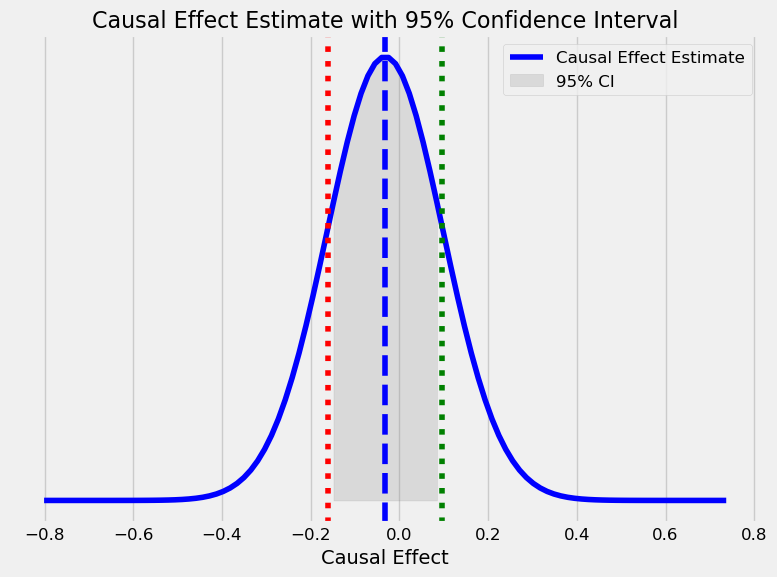

In [89]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm

# Causal effect estimate and confidence intervals
estimate = causal_effect[0][0]
lower_bound = causal_effect[1][0]
upper_bound = causal_effect[2][0]

# Generate data for the bell curve
x = np.linspace(estimate - 3 * (upper_bound - lower_bound), estimate + 3 * (upper_bound - lower_bound), 100)
y = norm.pdf(x, estimate, (upper_bound - lower_bound) / 1.96)

# Plot the confidence interval bell graph
plt.figure(figsize=(8, 6))
plt.plot(x, y, color='blue', label='Causal Effect Estimate')
plt.fill_between(x, y, 0, where=(x >= lower_bound) & (x <= upper_bound), color='gray', alpha=0.2, label='95% CI')
plt.axvline(estimate, color='blue', linestyle='--')
plt.axvline(lower_bound, color='red', linestyle=':')
plt.axvline(upper_bound, color='green', linestyle=':')
plt.xticks(fontsize=12)
plt.yticks([])
plt.xlabel('Causal Effect', fontsize=14)
plt.title('Causal Effect Estimate with 95% Confidence Interval', fontsize=16)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


In [90]:
from causalml.inference.meta import LRSRegressor
import pygraphviz as pgv
from IPython.display import Image, display

# Define the treatment variable and outcome variable
treatment_variable = 'Anode_life'
outcome_variable = 'Remaining_Life'

# Define the covariates (features) used for the regression model
covariates = ['Initial_Thickness', 'Age', 'Thickness', 'Corrosion_Rate', 'Pressure', 'OD',  'Allowable_Stress', 'Required_Thickness']

# Split the data into treatment, outcome, and covariates
treatment = data[treatment_variable].values
outcome = data[outcome_variable].values
covariates_data = data[covariates].values

# Create and fit the LRSRegressor model for causal inference
causal_model = LRSRegressor()
causal_model.fit(covariates_data, treatment, outcome)

# Save the causal graph to a file
causal_model.save_graph('causal_model.dot')

# Render the causal graph
graph = pgv.AGraph("causal_model.dot")
graph.draw('causal_model.png', format='png', prog='dot')

# Display the causal graph
display(Image(filename="causal_model.png"))

# Estimate the causal effect
causal_effect = causal_model.estimate_ate(X=covariates_data, treatment=treatment, y=outcome)

print("Causal effect estimate:", causal_effect)


AttributeError: 'LRSRegressor' object has no attribute 'save_graph'

## ECONML 
https://econml.azurewebsites.net/spec/estimation/dml.html

In [92]:
from econml.dml import DML
from sklearn.linear_model import LinearRegression

# Define the treatment, outcome, mediator, and covariates
treatment_variable='Anode_life'  # Treatment variable
outcome_variable='Remaining_Life'  # Outcome variable
covariates = ['Initial_Thickness', 'Age', 'Thickness', 'Corrosion_Rate', 'Pressure', 'OD',  'Allowable_Stress', 'Required_Thickness']


# Prepare the data
treatment = data[treatment_variable].values.reshape(-1, 1)
outcome = data[outcome_variable].values.reshape(-1, 1)
covariates_data = data[covariates].values

# Create and fit the DML model
dml_model = DML(model_y=LinearRegression(), model_t=LinearRegression(),
                model_final=LinearRegression())
dml_model.fit(Y=outcome, T=treatment, X=covariates_data)

# Estimate the individual treatment effects
treatment_effects = dml_model.effect(X=covariates_data)

# Print the treatment effects
for i, effect in enumerate(treatment_effects):
    print("Treatment effect for observation", i, ":", effect)


The final model has a nonzero intercept for at least one outcome; it will be subtracted, but consider fitting a model without an intercept if possible.


Treatment effect for observation 0 : [2.21117699]
Treatment effect for observation 1 : [2.82803138]
Treatment effect for observation 2 : [2.22364481]
Treatment effect for observation 3 : [-0.38213947]
Treatment effect for observation 4 : [2.79041225]
Treatment effect for observation 5 : [2.23540176]
Treatment effect for observation 6 : [-0.13216807]
Treatment effect for observation 7 : [-0.1015094]
Treatment effect for observation 8 : [1.6764366]
Treatment effect for observation 9 : [-0.02358057]
Treatment effect for observation 10 : [1.95773032]
Treatment effect for observation 11 : [-0.13213302]
Treatment effect for observation 12 : [2.27811497]
Treatment effect for observation 13 : [0.11962678]
Treatment effect for observation 14 : [0.18719713]
Treatment effect for observation 15 : [-0.09332904]
Treatment effect for observation 16 : [0.2575156]
Treatment effect for observation 17 : [-0.02043547]
Treatment effect for observation 18 : [0.12509602]
Treatment effect for observation 19 :

In [93]:
from econml.dml import LinearDML

# Define the treatment, outcome, mediator, and covariates
treatment_variable='Anode_life'  # Treatment variable
outcome_variable='Remaining_Life'  # Outcome variable
covariates = ['Initial_Thickness', 'Age', 'Thickness', 'Corrosion_Rate', 'Pressure', 'OD',  'Allowable_Stress', 'Required_Thickness']

# Prepare the data
treatment = data[treatment_variable].values.reshape(-1, 1)
outcome = data[outcome_variable].values.reshape(-1, 1)
covariates_data = data[covariates].values

# Create and fit the LinearDML model
dml_model = LinearDML()
dml_model.fit(Y=outcome, T=treatment, X=covariates_data)

# Calculate the causal effect interval
lb, ub = dml_model.effect_interval(X=covariates_data, alpha=0.05)

# Print the causal effect interval
print("Causal effect interval (95% confidence level): [{}, {}]".format(lb, ub))


Causal effect interval (95% confidence level): [[[3.87880282]
 [3.37804813]
 [3.09034061]
 ...
 [0.5785077 ]
 [1.852108  ]
 [1.34890728]], [[4.46140959]
 [3.607258  ]
 [3.33689346]
 ...
 [1.06512668]
 [2.13711757]
 [1.56417849]]]


## CAUSALNEX

In [14]:
from causalnex.structure import DAG
from causalnex.inference import InferenceEngine

dag = DAG()
dag.add_path(["Treatment", "Mediator", "Outcome"])
dag.add_path(["Control1", "Outcome"])
dag.add_path(["Control2", "Outcome"])
dag.add_path(["Control3", "Outcome"])

engine = InferenceEngine(dag)

engine.load_data(data)
treatment_node = "Treatment"
outcome_node = "Outcome"

causal_effect = engine.query_do(outcome_node, do={treatment_node: 1})

effect = causal_effect.value
confidence_level = causal_effect.confidence_level


ImportError: cannot import name 'DAG' from 'causalnex.structure' (/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/causalnex/structure/__init__.py)

In [2]:
from causalnex.structure.notears import from_pandas
from causalnex.structure import StructureModel

In [3]:
SM = from_pandas(data)

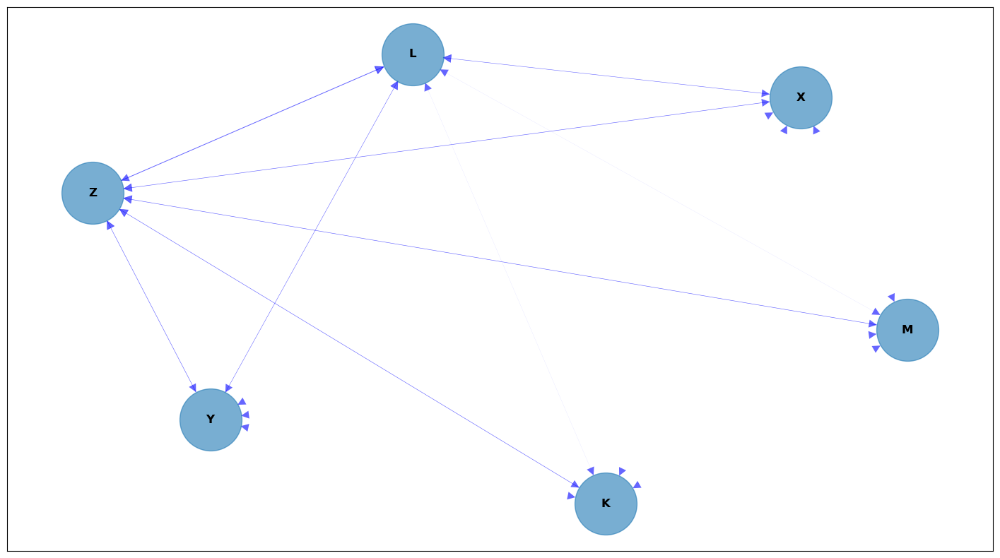

In [4]:
import networkx as nx

plt.figure(figsize=(18,10))
pos = nx.spring_layout(SM, k=60)
 
edge_width = [ d['weight']*0.3 for (u,v,d) in SM.edges(data=True)]
#nx.draw_networkx_labels(SM, pos, fontsize=16, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx_labels(SM, pos, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx(SM,
                 pos,
                 node_size=4000,
                 arrowsize=20,
                 alpha=0.6,
                 edge_color='b',
                 width=edge_width)

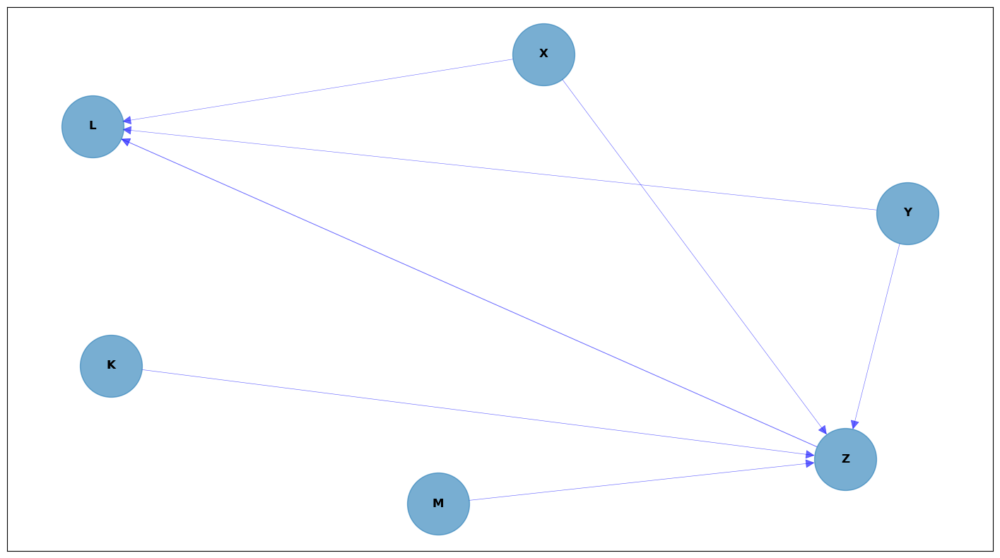

In [27]:
COPY_SM = SM.copy()
 
# 因果関係の弱いエッジを削除
COPY_SM.remove_edges_below_threshold(0.5)
 
# 可視化
plt.figure(figsize=(18,10))
pos = nx.spring_layout(COPY_SM, k=60)
 
edge_width = [ d['weight']*0.3 for (u,v,d) in COPY_SM.edges(data=True)]
#nx.draw_networkx_labels(COPY_SM, pos, fontsize=16, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx_labels(COPY_SM, pos, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx(COPY_SM,
                 pos,
                 node_size=4000,
                 arrowsize=20,
                 alpha=0.6,
                 edge_color='b',
                 width=edge_width)

In [5]:
sm = StructureModel()
sm.add_edges_from([
    ('Z','L'),
    ('X', 'Z'), 
    ('Y', 'Z'),
    ('M', 'Z'),
    ('M', 'L'),
    ('K', 'Z'),
    ('K', 'L')
])

In [6]:
import pygraphviz
from IPython.display import Image
from causalnex.plots import plot_structure, NODE_STYLE, EDGE_STYLE, draw_graph

viz = plot_structure(
    sm,
    #graph_attributes={"scale":"0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)

draw_graph(viz)

ImportError: cannot import name 'draw_graph' from 'causalnex.plots' (/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/causalnex/plots/__init__.py)

In [22]:
plt.figure(figsize=(18,10))
pos = nx.spring_layout(SM, k=60)
 
edge_width = [ d['weight']*0.3 for (u,v,d) in SM.edges(data=True)]
#nx.draw_networkx_labels(SM, pos, fontsize=16, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx_labels(SM, pos, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx(SM,
                 pos,
                 node_size=4000,
                 arrowsize=20,
                 alpha=0.6,
                 edge_color='b',
                 width=edge_width)

AttributeError: 'DataFrame' object has no attribute 'edges'

<Figure size 1800x1000 with 0 Axes>

In [17]:
import networkx as nx

nx.drawing.nx_pydot.write_dot(sm, 'graph.dot')

In [18]:
from causalnex.network import BayesianNetwork

bn = BayesianNetwork(sm)

In [19]:
# Split 90% train and 10% test
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, train_size=0.9, test_size=0.1, random_state=7)

In [20]:
bn = bn.fit_node_states(data)

In [ ]:
bn = bn.fit_cpds(train, method="BayesianEstimator", bayes_prior="K2")

## Regression - Non linear transformation

In [76]:
import pandas as pd
import statsmodels.api as sm
import scipy.stats as stats

def conditional_densities(data, use_confounders=True):
    treatment_variable = 'Anode_life'  # Treatment variable
    outcome_variable = 'Remaining_Life'  # Outcome variable
    covariates = ['Thickness', 'Initial_Thickness', 'Age']  # List of common causes
    mediator_variable = 'Corrosion_Rate'  # Mediator variable

    # If use_confounders is True, add the mediator_variable to the covariates list
    
    if use_confounders:
        covariates.append(mediator_variable)

    # Define the main part of the regression formula
    formula = f"{outcome_variable.replace(' ', '_')} ~ 1"
    
    # If use_confounders is True, add the covariates to the formula
    if use_confounders:
        formula += f" + {' + '.join(covariates)}"
        formula += f" + {mediator_variable.replace(' ', '_')} + {treatment_variable.replace(' ', '_')} + I({treatment_variable.replace(' ', '_')}**2)"
    
    # Create the OLS regression model
    model = sm.formula.ols(formula, data=data).fit()
    
    # Calculate the predicted values using the fitted model
    predicted_values = model.fittedvalues
    
    # Calculate the standard deviation of the model residuals
    std_resid = model.resid.std()
    
    # Create a normal distribution with the predicted values as the loc and std_resid as the scale
    density = stats.norm(loc=predicted_values, scale=std_resid)
    
    # Calculate the conditional densities for the treatment variable (Anode_life)
    densities = density.pdf(data[treatment_variable])
    
    # Return the conditional densities as a pandas Series with the treatment variable as the index
    return pd.Series(densities, index=data[treatment_variable].index)

denominator = conditional_densities(data,use_confounders=True)
numerator = conditional_densities(data, use_confounders=True)
generalized_ipw = numerator / denominator


In [77]:
msm_formula = f"{outcome_variable.replace(' ', '_')} ~ 1 + {treatment_variable.replace(' ', '_')} + I({treatment_variable.replace(' ', '_')}**2)"
msm = sm.formula.wls(msm_formula, data=data, weights=generalized_ipw).fit()

dosage = list(range(10))
dosage = pd.DataFrame(
    data={"Anode_life": dosage, "I(Anode_life**2)": dosage},
    index=dosage,
)
response = msm.predict(dosage)


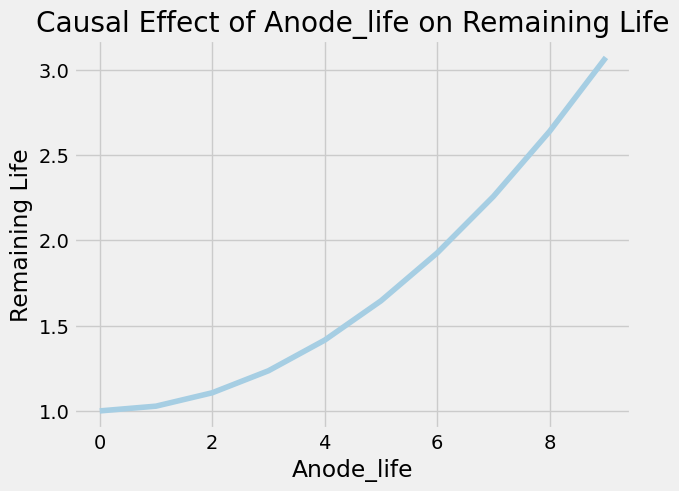

In [79]:
# Plot the predictions for the outcome variable against the treatment variable
ax = response.plot(
    kind="line",
    xlabel="Anode_life",
    ylabel="Remaining Life",
    title="Causal Effect of Anode_life on Remaining Life"
)

# Show the plot
plt.show()

#ax.figure.savefig(f"{__file__}.png")

In [80]:
import pandas as pd
import statsmodels.api as sm
import scipy.stats as stats

def calculate_stabilized_weights(data, treatment_variable):
    # Calculate the treatment prevalence (average of binary treatment)
    treatment_prevalence = data[treatment_variable].mean()

    # Calculate the stabilized weights as the density of treatment values
    # under the average treatment value
    density = stats.norm(loc=treatment_prevalence, scale=1)
    stabilized_weights = density.pdf(data[treatment_variable])

    return stabilized_weights

def conditional_densities(data, treatment_variable, outcome_variable, covariates, mediator_variable, use_confounders=True):
    # If use_confounders is True, add the mediator_variable to the covariates list
    if use_confounders:
        covariates.append(mediator_variable)

    # Define the main part of the regression formula
    formula = f"{outcome_variable} ~ 1"
    
    # If use_confounders is True, add the covariates to the formula
    if use_confounders:
        formula += f" + {' + '.join(covariates)}"
        formula += f" + {mediator_variable} + {treatment_variable} + I({treatment_variable}**2)"

    # Create the OLS regression model
    model = sm.formula.ols(formula, data=data).fit()

    # Calculate the predicted values using the fitted model
    predicted_values = model.fittedvalues

    # Calculate the standard deviation of the model residuals
    std_resid = model.resid.std()

    # Create a normal distribution with the predicted values as the loc and std_resid as the scale
    density = stats.norm(loc=predicted_values, scale=std_resid)

    # Calculate the stabilized weights using the function we defined earlier
    stabilized_weights = calculate_stabilized_weights(data, treatment_variable)

    # Calculate the conditional densities for the treatment variable (Anode_life)
    densities = density.pdf(data[treatment_variable]) * stabilized_weights

    # Return the conditional densities as a pandas Series with the treatment variable as the index
    return pd.Series(densities, index=data[treatment_variable].index)


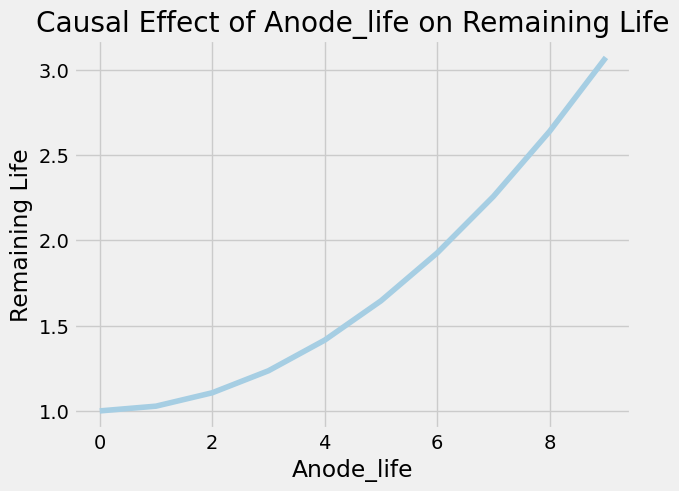

In [81]:
msm_formula = f"{outcome_variable.replace(' ', '_')} ~ 1 + {treatment_variable.replace(' ', '_')} + I({treatment_variable.replace(' ', '_')}**2)"
msm = sm.formula.wls(msm_formula, data=data, weights=generalized_ipw).fit()

dosage = list(range(10))
dosage = pd.DataFrame(
    data={"Anode_life": dosage, "I(Anode_life**2)": dosage},
    index=dosage,
)
response = msm.predict(dosage)

# Plot the predictions for the outcome variable against the treatment variable
ax = response.plot(
    kind="line",
    xlabel="Anode_life",
    ylabel="Remaining Life",
    title="Causal Effect of Anode_life on Remaining Life"
)

# Show the plot
plt.show()

#ax.figure.savefig(f"{__file__}.png")

## Comparison of 4 python libraries

Comparing the performance of different causal inference libraries, such as DoWhy, CausalML, EconML, and CausalNex, can be a complex task as it depends on various factors, including the specific use case, data characteristics, and the causal inference methods employed. Here's a general overview of these libraries:

1. DoWhy:
   - DoWhy is a Python library that provides a unified interface for causal inference tasks.
   - It offers a wide range of causal inference methods, including methods based on graphical models, propensity score matching, and instrumental variables.
   - DoWhy is designed to handle both continuous and binary treatments and outcomes.
   - It provides methods for identification, estimation, and evaluation of causal effects.

2. CausalML:
   - CausalML is a Python library that focuses on meta-learning and provides tools for estimating heterogeneous treatment effects.
   - It offers various algorithms and techniques, such as doubly robust estimators and ensemble methods, to estimate causal effects.
   - CausalML supports both continuous and binary treatments.
   - It provides methods for estimating individual treatment effects and treatment effect heterogeneity.

3. EconML:
   - EconML is a Python library developed by Microsoft Research for estimating treatment effects using modern econometric and machine learning methods.
   - It provides a wide range of algorithms, including double machine learning (DML) and instrumental variable methods, to estimate causal effects.
   - EconML supports both continuous and binary treatments.
   - It offers methods for estimating both average treatment effects and individual treatment effects.

4. CausalNex:
   - CausalNex is a Python library that focuses on causal discovery and Bayesian network inference.
   - It provides tools for learning the structure of causal Bayesian networks from data.
   - CausalNex is primarily used for discovering causal relationships and making probabilistic predictions based on the learned network structure.
   - It can handle continuous and discrete variables, but its primary focus is on structure learning rather than estimating causal effects.

To compare the performance of these libraries, you would need to define specific evaluation criteria, select appropriate datasets and causal inference tasks, and implement the methods provided by each library. The performance can be evaluated based on various metrics, such as accuracy of causal effect estimation, robustness to different data settings, computational efficiency, and ease of use.

It is important to note that the choice of library depends on the specific requirements of your causal inference task, the complexity of the data, and the methods that best suit your needs. It is recommended to explore the documentation, examples, and tutorials provided by each library to gain a better understanding of their capabilities and suitability for your specific use case.

Please note that this is a general overview, and for a comprehensive and specific comparison, it is recommended to delve deeper into the documentation and examples provided by each library, and consider your specific use case and requirements.

In [54]:
import pandas as pd
import numpy as np
from dowhy import CausalModel
from causalml.inference.meta import BaseXRegressor
from econml.dml import LinearDML
from causalnex.structure import StructureModel
from causalnex.inference import InferenceEngine

# Synthetic data 'data' with columns D, X, Y, C1, C2, C3

# DoWhy Example
model_dowhy = CausalModel(
    data=data,
    treatment='Anode_life',  # Treatment variable
    outcome='Remaining Life',  # Outcome variable
    common_causes=['Thickness', 'Initial Thickness', 'Age'], # List of common causes, 
    mediator ='Corrosion Rate'
)

identified_estimand = model_dowhy.identify_effect(proceed_when_unidentifiable=True)
estimate_dowhy = model_dowhy.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")


print("DoWhy Causal Effect Estimate:", estimate_dowhy.value)
print("Causal effect confidence intervals:")
confidence_intervals = estimate_dowhy.get_confidence_intervals()
for i in range(len(confidence_intervals)):
    print("Interval", i+1)
    print("Lower bound:", confidence_intervals[i][0])
    print("Upper bound:", confidence_intervals[i][1])

DoWhy Causal Effect Estimate: 0.5056529429514213
Causal effect confidence intervals:
Interval 1
Lower bound: 0.5042299098401034
Upper bound: 0.5070759760627391


In [94]:
# CausalML Example
treatment_variable='Anode_life' # Treatment variable
outcome_variable='Remaining_Life'  # Outcome variable
covariates = ['Initial_Thickness', 'Age', 'Thickness', 'Corrosion_Rate', 'Pressure', 'OD',  'Allowable_Stress', 'Required_Thickness']


from causalml.inference.meta import LRSRegressor

lr = LRSRegressor()
te, lb, ub = lr.estimate_ate(X=data[covariates], treatment=data[treatment_variable], y=data[outcome_variable])
print('Average Treatment Effect (Linear Regression): {:.2f} ({:.2f}, {:.2f})'.format(te[0], lb[0], ub[0]))

Average Treatment Effect (Linear Regression): -0.03 (-0.16, 0.10)


In [57]:
# EconML Example
est_econml = LinearDML()
est_econml.fit(Y=data[outcome_variable], T=data[treatment_variable], X=data[covariates], W=data[mediator_variable])

lb, ub = est_econml.effect_interval(X=data[covariates], T0=0, T1=1, alpha=0.05)
print("EconML Causal Effect Confidence Interval: [{}, {}]".format(lb, ub))


ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 2 dimension(s) and the array at index 1 has 1 dimension(s)

In [58]:
# CausalNex Example
structure_model = StructureModel()
structure_model.add_edges_from(edges)
dag = structure_model.to_dag()

infer_engine = InferenceEngine(dag)
infer_engine.do_intervention('D', values=1)
causal_effect_nex = infer_engine.query('Y', do={'D': 1})
print("CausalNex Causal Effect:", causal_effect_nex)


AttributeError: 'StructureModel' object has no attribute 'to_dag'